In [13]:
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.nn import functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from skimage import io as image_io
from torch import optim
import timm
from tqdm import tqdm
import seaborn as sns
from PIL import ImageEnhance, Image
import gc
import optuna
from optuna.trial import TrialState, Trial
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from matplotlib import pyplot as plt

In [177]:
labels = ['HR+', 'HER2+', 'TNBC']
train_df = pd.read_csv('../data/img_augmented_train_df_text.csv')
train_df.set_index(['patient_id', 'file_name'], inplace=True)

test_df = pd.read_csv('../data/img_test_df.csv')
test_df.set_index(['patient_id', 'file_name'], inplace=True)

re_test_df = pd.read_csv('../data/re_test.csv')

In [189]:
train_df2 = pd.read_csv('../data/img_augmented_train_df.csv')
train_df2.set_index(['patient_id', 'file_name'], inplace=True)

In [15]:
re_test_df

,patient_id,label
0,TCGA-EW-A6SD-01A-01-T,HER2+
1,TCGA-B6-A0IG-01A-01-B,HER2+
2,TCGA-BH-A1FU-11A-02-T,HER2+
3,TCGA-BH-A1FU-01A-01-T,HER2+
4,TCGA-B6-A0I9-01A-01-B,HER2+
5,TCGA-B6-A0IG-01A-01-T,HER2+
6,TCGA-AC-A2FM-11B-03-T,HER2+
7,TCGA-BH-A18R-11A-02-T,HER2+
8,TCGA-B6-A0RH-01A-02-T,HER2+
9,TCGA-E9-A228-01A-03-T,HER2+


In [190]:
def get_patient_labels(df: pd.DataFrame):
    return pd.DataFrame([[p_id, df.loc[p_id].iloc[0, 0]] for p_id in df.index.get_level_values(0).unique()], columns=['patient_id', 'label']).set_index('patient_id')
train_label_df = get_patient_labels(train_df)
train_label_df2 = get_patient_labels(train_df2)
test_label_df = get_patient_labels(test_df)

In [191]:
train_label_df.index

Index(['TCGA-3C-AALI-01A-01-T', 'TCGA-5L-AAT0-01A-01-T',
       'TCGA-A1-A0SE-01A-01-B', 'TCGA-A1-A0SF-01A-01-T',
       'TCGA-A1-A0SG-01A-01-B', 'TCGA-A1-A0SG-01A-01-T',
       'TCGA-A1-A0SH-01A-01-B', 'TCGA-A1-A0SI-01A-01-B',
       'TCGA-A1-A0SI-01A-01-T', 'TCGA-A1-A0SJ-01A-01-T',
       ...
       'TCGA-E9-A247-01A-01-Tv3', 'TCGA-E9-A248-01A-01-Tv3',
       'TCGA-E9-A2JS-01A-01-Tv3', 'TCGA-E9-A3Q9-01A-01-Tv3',
       'TCGA-E9-A3QA-01A-06-Tv3', 'TCGA-E9-A5UO-01A-01-Tv3',
       'TCGA-EW-A6SD-01A-01-Tv3', 'TCGA-PL-A8LV-01A-02-Dv3',
       'TCGA-PL-A8LX-01A-01-Dv3', 'TCGA-PL-A8LZ-01A-03-Dv3'],
      dtype='object', name='patient_id', length=1918)

In [184]:
train_label_df.index[~train_label_df.index.str.endswith(('v2','v3'))]

Index(['TCGA-3C-AALI-01A-01-T', 'TCGA-5L-AAT0-01A-01-T',
       'TCGA-A1-A0SE-01A-01-B', 'TCGA-A1-A0SF-01A-01-T',
       'TCGA-A1-A0SG-01A-01-B', 'TCGA-A1-A0SG-01A-01-T',
       'TCGA-A1-A0SH-01A-01-B', 'TCGA-A1-A0SI-01A-01-B',
       'TCGA-A1-A0SI-01A-01-T', 'TCGA-A1-A0SJ-01A-01-T',
       ...
       'TCGA-E9-A247-01A-01-T', 'TCGA-E9-A248-01A-01-T',
       'TCGA-E9-A2JS-01A-01-T', 'TCGA-E9-A3Q9-01A-01-T',
       'TCGA-E9-A3QA-01A-06-T', 'TCGA-E9-A5UO-01A-01-T',
       'TCGA-EW-A6SD-01A-01-T', 'TCGA-PL-A8LV-01A-02-D',
       'TCGA-PL-A8LX-01A-01-D', 'TCGA-PL-A8LZ-01A-03-D'],
      dtype='object', name='patient_id', length=1048)

<AxesSubplot:>

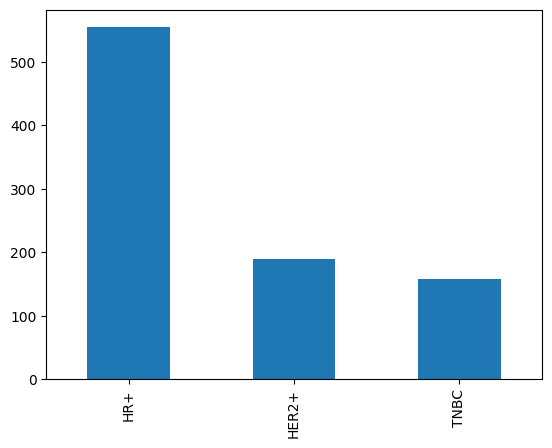

In [194]:
train_label_df2['label'][~train_label_df2.index.str.endswith(('v2','v3'))].value_counts().plot(kind='bar')

In [186]:
train_label_df2.index[~train_label_df2.index.str.endswith(('v2','v3'))]

Index(['TCGA-3C-AALI-01A-01-T', 'TCGA-5L-AAT0-01A-01-T',
       'TCGA-A1-A0SE-01A-01-B', 'TCGA-A1-A0SF-01A-01-T',
       'TCGA-A1-A0SG-01A-01-B', 'TCGA-A1-A0SG-01A-01-T',
       'TCGA-A1-A0SH-01A-01-B', 'TCGA-A1-A0SI-01A-01-B',
       'TCGA-A1-A0SI-01A-01-T', 'TCGA-A1-A0SJ-01A-01-T',
       ...
       'TCGA-E9-A247-01A-01-T', 'TCGA-E9-A248-01A-01-T',
       'TCGA-E9-A2JS-01A-01-T', 'TCGA-E9-A3Q9-01A-01-T',
       'TCGA-E9-A3QA-01A-06-T', 'TCGA-E9-A5UO-01A-01-T',
       'TCGA-EW-A6SD-01A-01-T', 'TCGA-PL-A8LV-01A-02-D',
       'TCGA-PL-A8LX-01A-01-D', 'TCGA-PL-A8LZ-01A-03-D'],
      dtype='object', name='patient_id', length=1048)

In [94]:
train_label_df['pid'] = ['-'.join(l.split('-')[0:3]) for l in train_label_df.index.to_list()]

In [95]:
train_label_df = train_label_df[~train_label_df.index.isin(re_test_df['patient_id'])]

<AxesSubplot:>

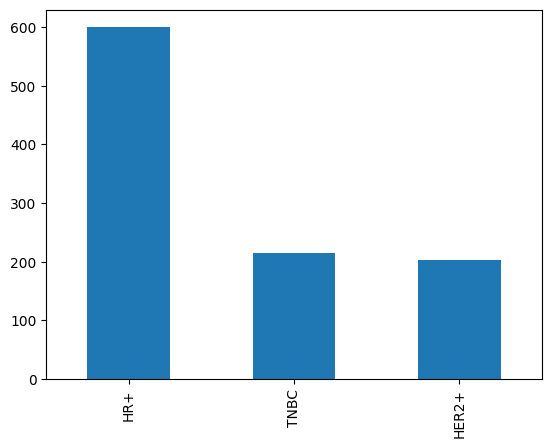

In [96]:
train_label_df.loc[~train_label_df.index.str.endswith(('v2', 'v3'))]['label'].value_counts().plot.bar()

<AxesSubplot:>

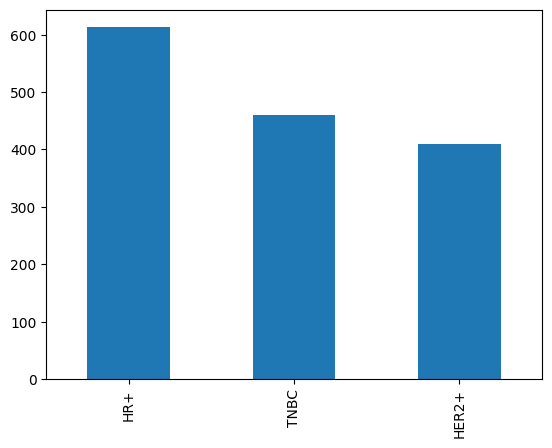

In [196]:
train_label_df = train_label_df[(train_label_df['label'] == 'HR+') | train_label_df.index.str.endswith(('v2', 'v3'))]
train_label_df['label'].value_counts().plot.bar()

In [80]:
train_label_df[(train_label_df['label'] == 'HR+') | train_label_df.index.str.endswith(('v2', 'v3'))]['label'].value_counts()

HR+      649
HER2+    416
TNBC     382
Name: label, dtype: int64

<AxesSubplot:>

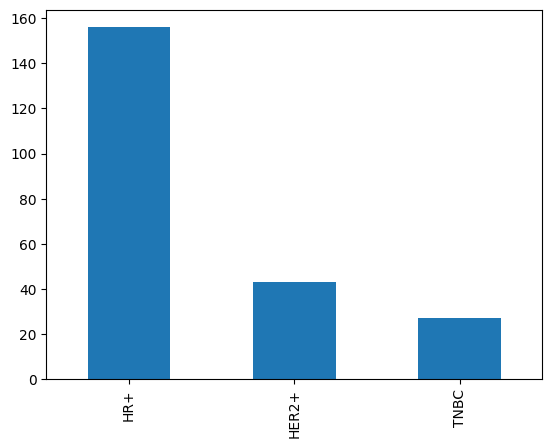

In [81]:
test_label_df['label'].value_counts().plot.bar()

In [98]:
class TCGABags(Dataset):
    def __init__(self, df, labels, is_train=True):
        self.df = df
        self.idx = df.index.to_list()
        self.labels = labels
        self.augmentations = ['bc', 'hed', 'hsv', 'morphology', 'none']
        self.is_train = is_train

    def __len__(self):
        return len(self.idx)

    def __getitem__(self, index):
        patient_id = self.idx[index]
        selected_aug = np.random.choice(self.augmentations) if self.is_train else 'none'
        features = torch.load(f"../data/TCGA_features_resnet2/{selected_aug}/{patient_id}.pt")
        label = self.df['label'].loc[patient_id]
        return features, self.labels.index(label)
    
dl = DataLoader(TCGABags(train_label_df, ['HER2+', 'HR+', 'TNBC']), batch_size=1)
for img, label in dl:
    print(img.shape)
    break


torch.Size([1, 20, 1000])


In [99]:
class Attn_Net(nn.Module):

    def __init__(self, L = 1024, D = 256, dropout = 0.25, n_classes = 1):
        super(Attn_Net, self).__init__()
        self.module = [
            nn.Linear(L, D),
            nn.Tanh()]

        self.module.append(nn.Dropout(dropout))

        self.module.append(nn.Linear(D, n_classes))
        
        self.module = nn.Sequential(*self.module)
    
    def forward(self, x):
        return self.module(x), x # N x n_classes

"""
Attention Network with Sigmoid Gating (3 fc layers)
args:
    L: input feature dimension
    D: hidden layer dimension
    dropout: whether to use dropout (p = 0.25)
    n_classes: number of classes 
"""
class Attn_Net_Gated(nn.Module):
    def __init__(self, L = 1024, D = 256, dropout = 0.25, n_classes = 1):
        super(Attn_Net_Gated, self).__init__()
        self.attention_a = [
            nn.Linear(L, D),
            nn.Tanh()]
        
        self.attention_b = [nn.Linear(L, D),
                            nn.Sigmoid()]
        self.attention_a.append(nn.Dropout(dropout))
        self.attention_b.append(nn.Dropout(dropout))

        self.attention_a = nn.Sequential(*self.attention_a)
        self.attention_b = nn.Sequential(*self.attention_b)
        
        self.attention_c = nn.Linear(D, n_classes)

    def forward(self, x):
        a = self.attention_a(x)
        b = self.attention_b(x)
        A = a.mul(b)
        A = self.attention_c(A)  # N x n_classes
        return A, x

"""
args:
    gate: whether to use gated attention network
    size_arg: config for network size
    dropout: whether to use dropout
    k_sample: number of positive/neg patches to sample for instance-level training
    dropout: whether to use dropout (p = 0.25)
    n_classes: number of classes 
    instance_loss_fn: loss function to supervise instance-level training
    subtyping: whether it's a subtyping problem
"""
class CLAM_SB(nn.Module):
    def __init__(self, gate = True, size_arg = "small", d_size = 256, fc_dropout = 0., att_dropout = 0., k_sample=8, n_classes=3,
        instance_loss_fn=nn.CrossEntropyLoss(), subtyping=True, embed_dim=1024, is_mb=True):
        super().__init__()
        self.is_mb = is_mb
        att_classes = n_classes if is_mb else 2
        # self.size_dict = {"small": [embed_dim, 512, 256], "big": [embed_dim, 512, 384]}
        self.size_dict = {"small": [embed_dim, 512, d_size], "big": [embed_dim, 512, 384]} #TODO: CHANGE IT
        size = self.size_dict[size_arg]
        fc = [nn.Linear(size[0], size[1]), nn.ReLU(), nn.Dropout(fc_dropout)]
        if gate:
            attention_net = Attn_Net_Gated(L = size[1], D = size[2], dropout = att_dropout, n_classes = att_classes)
        else:
            attention_net = Attn_Net(L = size[1], D = size[2], dropout = att_dropout, n_classes = att_classes)
        fc.append(attention_net)
        self.attention_net = nn.Sequential(*fc)
        
        if is_mb:
            bag_classifiers = [nn.Linear(size[1], 1) for i in range(n_classes)]
            self.classifiers = nn.ModuleList(bag_classifiers)
        else: self.classifiers = nn.Linear(size[1], n_classes)

        instance_classifiers = [nn.Linear(size[1], 2) for i in range(n_classes)]
        self.instance_classifiers = nn.ModuleList(instance_classifiers)
        self.k_sample = k_sample
        self.instance_loss_fn = instance_loss_fn
        self.n_classes = n_classes
        self.subtyping = subtyping
    
    @staticmethod
    def create_positive_targets(length, device):
        return torch.full((length, ), 1, device=device).long()
    
    @staticmethod
    def create_negative_targets(length, device):
        return torch.full((length, ), 0, device=device).long()
    
    #instance-level evaluation for in-the-class attention branch
    def inst_eval(self, A, h, classifier): 
        device=h.device
        if len(A.shape) == 1:
            print(A)
            A = A.view(1, -1)
        try:
            top_p_ids = torch.topk(A, self.k_sample)[1][-1]
        except:
            # print(A.shape)
            raise ValueError()
        top_p = torch.index_select(h, dim=0, index=top_p_ids)
        top_n_ids = torch.topk(-A, self.k_sample, dim=1)[1][-1]
        top_n = torch.index_select(h, dim=0, index=top_n_ids)
        p_targets = self.create_positive_targets(self.k_sample, device)
        n_targets = self.create_negative_targets(self.k_sample, device)

        all_targets = torch.cat([p_targets, n_targets], dim=0)
        all_instances = torch.cat([top_p, top_n], dim=0)
        logits = classifier(all_instances)
        all_preds = torch.topk(logits, 1, dim = 1)[1].squeeze(1)
        instance_loss = self.instance_loss_fn(logits, all_targets)
        return instance_loss, all_preds, all_targets
    
    #instance-level evaluation for out-of-the-class attention branch
    def inst_eval_out(self, A, h, classifier):
        device=h.device
        if len(A.shape) == 1:
            A = A.view(1, -1)
        try:
            top_p_ids = torch.topk(A, self.k_sample)[1][-1]
            # print(A)
        except:
            # print(A.shape)
            raise ValueError()
        # print(top_p_ids)
        top_p = torch.index_select(h, dim=0, index=top_p_ids)
        p_targets = self.create_negative_targets(self.k_sample, device)
        logits = classifier(top_p)
        p_preds = torch.topk(logits, 1, dim = 1)[1].squeeze(1)
        instance_loss = self.instance_loss_fn(logits, p_targets)
        return instance_loss, p_preds, p_targets

    def forward(self, h, label=None, instance_eval=False, return_features=False, attention_only=False):
        A, h = self.attention_net(h)  # NxK        
        A = torch.transpose(A, 1, 0)  # KxN
        if attention_only:
            return A
        A_raw = A
        A = F.softmax(A, dim=1)  # softmax over N

        if instance_eval:
            total_inst_loss = 0.0
            all_preds = []
            all_targets = []
            inst_labels = F.one_hot(label, num_classes=self.n_classes).squeeze() #binarize label
            for i in range(len(self.instance_classifiers)):
                inst_label = inst_labels[i].item()
                classifier = self.instance_classifiers[i]
                if inst_label == 1: #in-the-class:
                    instance_loss, preds, targets = self.inst_eval(A, h, classifier)
                    all_preds.extend(preds.cpu().numpy())
                    all_targets.extend(targets.cpu().numpy())
                else: #out-of-the-class
                    if self.subtyping:
                        instance_loss, preds, targets = self.inst_eval_out(A, h, classifier)
                        all_preds.extend(preds.cpu().numpy())
                        all_targets.extend(targets.cpu().numpy())
                    else:
                        continue
                total_inst_loss += instance_loss

            if self.subtyping:
                total_inst_loss /= len(self.instance_classifiers)
                
        M = torch.mm(A, h)
         
        
        if self.is_mb:
            logits = torch.empty(1, self.n_classes).float().to(M.device)
            for c in range(self.n_classes):
                logits[0, c] = self.classifiers[c](M[c])
        else:
            logits = self.classifiers(M)
        Y_hat = torch.topk(logits, 1, dim = 1)[1]
        Y_prob = F.softmax(logits, dim = 1)
        if instance_eval:
            results_dict = {'instance_loss': total_inst_loss, 'inst_labels': np.array(all_targets), 
            'inst_preds': np.array(all_preds)}
        else:
            results_dict = {}
        if return_features:
            results_dict.update({'features': M})
        return logits, Y_prob, Y_hat, A_raw, results_dict

In [100]:
def plot_training_stats(train_losses, valid_losses, valid_accuracies, title):
    fig, axs = plt.subplots(1, 3, figsize=(21, 5))
    fig.suptitle(title, fontsize=20)
    axs[0].plot(train_losses)
    axs[0].title.set_text('train losses')
    axs[1].plot(valid_losses)
    axs[1].title.set_text('valid losses')
    axs[2].plot(valid_accuracies)
    axs[2].title.set_text('valid accuracies')

    new_title = title.replace('_', '__').replace('.', '_')
    fig.savefig(f'../plots/image/{new_title}.png')

In [101]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def map_output_to_labels(arr: list, labels):
    # return [labels[el.index(1.0)] for el in arr]
    return [labels[el] for el in arr]

def plot_confusion_matrix(actual, predicted, title, labels):
    fig, ax = plt.subplots()
    fig.suptitle(title, fontsize=20)
    
    cm = confusion_matrix(map_output_to_labels(actual, labels), map_output_to_labels(predicted, labels), labels=labels)
    # sns.heatmap(cm, yticklabels=labels, xticklabels=labels)
    ConfusionMatrixDisplay(cm, display_labels=labels).plot(ax=ax)
    new_title = title.replace('_', '__').replace('.', '_')
    fig.savefig(f'../plots/image/{new_title}__corr.png')

# plot_confusion_matrix([1, 2, 0], [1, 2, 2], 'test', ['aa', 'bb', 'cc'])

In [102]:
import shutil, sys   
def save_ckp(state, checkpoint_path, best_model_path=None):
    """
    state: checkpoint we want to save
    checkpoint_path: path to save checkpoint
    best_model_path: path to save best model
    is_best: is this the best checkpoint; min validation loss
    """
    f_path = checkpoint_path
    torch.save(state, f_path)
    
    if best_model_path is not None:
        best_fpath = best_model_path
        # copy that checkpoint file to best path given, best_model_path
        shutil.copyfile(f_path, best_fpath)

In [103]:
max_study_accuracy = 0

In [81]:
from sklearn.metrics import f1_score, balanced_accuracy_score, precision_score, recall_score, accuracy_score
def get_model_stats(actual, predicted):
    global_stats = f"accuracy_{balanced_accuracy_score(actual, predicted)} precision_{precision_score(actual, predicted, average='weighted')} recall_{recall_score(actual, predicted, average='weighted')} f1_{f1_score(actual, predicted, average='weighted')}"
    local_stats = f"precision_{precision_score(actual, predicted, average=None)} recall_{recall_score(actual, predicted, average=None)} f1_{f1_score(actual, predicted, average=None)}"
    
    return global_stats, local_stats

In [ ]:
test_df['label'].value_counts()

TNBC     216
HR+       58
HER2+     48
Name: label, dtype: int64

[I 2024-06-11 08:42:13,140] A new study created in memory with name: no-name-fce978a5-a21c-44d3-a820-0625a0b1b978


Epoch: 0 	Avgerage Training Loss: 1.283087 	Average Validation Loss: 1.010466	Validation accuracy: 0.333333
Early stopped training at epoch 11
[67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167]


[I 2024-06-11 08:44:46,083] Trial 0 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.523799956095103, 'lr': 0.0009056625446569301, 'weight_decay': 0.0019568910376987505, 'd_size': 128, 'gated': False, 'att_dropout': 0.15560118820950022, 'fc_dropout': 0.3844737097627905, 'top_k': 2}. Best is trial 0 with value: 0.3333333333333333.


Epoch: 0 	Avgerage Training Loss: 1.061492 	Average Validation Loss: 1.088760	Validation accuracy: 0.363142
Epoch: 1 	Avgerage Training Loss: 1.039493 	Average Validation Loss: 0.921831	Validation accuracy: 0.433236
Epoch: 5 	Avgerage Training Loss: 1.015299 	Average Validation Loss: 0.967190	Validation accuracy: 0.444055
Epoch: 8 	Avgerage Training Loss: 1.016227 	Average Validation Loss: 1.019207	Validation accuracy: 0.507306
Early stopped training at epoch 19
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 08:48:49,694] Trial 1 finished with value: 0.507306163772912 and parameters: {'bag_weight': 0.7992330974393449, 'lr': 7.94805363618034e-06, 'weight_decay': 7.074500369419571e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.16376167443678663, 'fc_dropout': 0.13658328390519625, 'top_k': 3}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.157493 	Average Validation Loss: 1.055133	Validation accuracy: 0.492064
Early stopped training at epoch 11
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 08:51:14,350] Trial 2 finished with value: 0.4920643123743899 and parameters: {'bag_weight': 0.7665850341062996, 'lr': 0.00025156606914110267, 'weight_decay': 1.6196401247978725e-07, 'd_size': 256, 'gated': False, 'att_dropout': 0.24548146695200504, 'fc_dropout': 0.19499419221867167, 'top_k': 5}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.147233 	Average Validation Loss: 1.085362	Validation accuracy: 0.415839
Epoch: 1 	Avgerage Training Loss: 1.040064 	Average Validation Loss: 1.039917	Validation accuracy: 0.428714
Epoch: 4 	Avgerage Training Loss: 1.038649 	Average Validation Loss: 1.008860	Validation accuracy: 0.447949
Epoch: 6 	Avgerage Training Loss: 1.032102 	Average Validation Loss: 1.025267	Validation accuracy: 0.462650
Epoch: 13 	Avgerage Training Loss: 1.021700 	Average Validation Loss: 0.955372	Validation accuracy: 0.490876
Epoch: 20 	Avgerage Training Loss: 1.011253 	Average Validation Loss: 0.987318	Validation accuracy: 0.505035
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213,

[I 2024-06-11 08:57:31,810] Trial 3 finished with value: 0.5050346281240591 and parameters: {'bag_weight': 0.5357332320686224, 'lr': 0.00012411809152695525, 'weight_decay': 0.0034969196160134788, 'd_size': 128, 'gated': True, 'att_dropout': 0.2921494398069976, 'fc_dropout': 0.2251830311867341, 'top_k': 8}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.071221 	Average Validation Loss: 1.099560	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.042164 	Average Validation Loss: 1.072003	Validation accuracy: 0.359045
Epoch: 2 	Avgerage Training Loss: 1.032846 	Average Validation Loss: 1.095274	Validation accuracy: 0.374756
Epoch: 3 	Avgerage Training Loss: 1.025793 	Average Validation Loss: 1.101210	Validation accuracy: 0.414249
Epoch: 4 	Avgerage Training Loss: 1.019480 	Average Validation Loss: 1.058685	Validation accuracy: 0.448371
Epoch: 6 	Avgerage Training Loss: 1.012446 	Average Validation Loss: 1.025860	Validation accuracy: 0.475707
Epoch: 16 	Avgerage Training Loss: 0.992717 	Average Validation Loss: 1.063030	Validation accuracy: 0.486691
Epoch: 25 	Avgerage Training Loss: 0.987007 	Average Validation Loss: 1.008144	Validation accuracy: 0.497361
Epoch: 26 	Avgerage Training Loss: 0.995895 	Average Validation Loss: 1.023587	Validation accuracy: 0.505157
[67, 147, 153, 167, 67, 1

[I 2024-06-11 09:04:22,701] Trial 4 finished with value: 0.5051566254136634 and parameters: {'bag_weight': 0.6334770853520313, 'lr': 3.5279796179118924e-06, 'weight_decay': 0.0002668788594957427, 'd_size': 256, 'gated': False, 'att_dropout': 0.10867774786476643, 'fc_dropout': 0.4670084230189715, 'top_k': 3}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.148004 	Average Validation Loss: 1.200173	Validation accuracy: 0.342716
Epoch: 1 	Avgerage Training Loss: 1.082228 	Average Validation Loss: 1.066629	Validation accuracy: 0.354568
Epoch: 2 	Avgerage Training Loss: 1.064553 	Average Validation Loss: 1.118185	Validation accuracy: 0.448102
Epoch: 12 	Avgerage Training Loss: 1.018727 	Average Validation Loss: 1.015352	Validation accuracy: 0.464823
Epoch: 22 	Avgerage Training Loss: 1.009430 	Average Validation Loss: 1.041171	Validation accuracy: 0.479535
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147,

[I 2024-06-11 09:10:35,137] Trial 5 finished with value: 0.47953488372093017 and parameters: {'bag_weight': 0.7112365595114474, 'lr': 4.1714330252724365e-05, 'weight_decay': 0.02320485182791139, 'd_size': 256, 'gated': True, 'att_dropout': 0.2664736153820485, 'fc_dropout': 0.18336705389582295, 'top_k': 5}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.171892 	Average Validation Loss: 1.017038	Validation accuracy: 0.326667
Epoch: 1 	Avgerage Training Loss: 1.044062 	Average Validation Loss: 0.961477	Validation accuracy: 0.333333
Early stopped training at epoch 12
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 09:13:08,360] Trial 6 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.698080500082201, 'lr': 0.0007185394568060439, 'weight_decay': 1.122887378917726e-07, 'd_size': 256, 'gated': False, 'att_dropout': 0.37440829285405297, 'fc_dropout': 0.3469766424883466, 'top_k': 5}. Best is trial 1 with value: 0.507306163772912.


Epoch: 0 	Avgerage Training Loss: 1.076621 	Average Validation Loss: 0.928418	Validation accuracy: 0.317982
Epoch: 1 	Avgerage Training Loss: 1.051385 	Average Validation Loss: 1.129909	Validation accuracy: 0.413784
Epoch: 3 	Avgerage Training Loss: 1.033719 	Average Validation Loss: 1.012570	Validation accuracy: 0.456157
Epoch: 6 	Avgerage Training Loss: 1.026602 	Average Validation Loss: 1.010297	Validation accuracy: 0.495969
Epoch: 15 	Avgerage Training Loss: 1.001853 	Average Validation Loss: 1.090049	Validation accuracy: 0.497412
Epoch: 22 	Avgerage Training Loss: 0.978209 	Average Validation Loss: 1.117185	Validation accuracy: 0.518169
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147

[I 2024-06-11 09:19:20,041] Trial 7 finished with value: 0.5181690768696073 and parameters: {'bag_weight': 0.8536257338896416, 'lr': 1.0643417456064723e-05, 'weight_decay': 2.3107001444425853e-07, 'd_size': 128, 'gated': True, 'att_dropout': 0.20591649439213616, 'fc_dropout': 0.1568609840965623, 'top_k': 3}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.055530 	Average Validation Loss: 1.035099	Validation accuracy: 0.401527
Epoch: 1 	Avgerage Training Loss: 1.025352 	Average Validation Loss: 1.013703	Validation accuracy: 0.421326
Epoch: 6 	Avgerage Training Loss: 1.005840 	Average Validation Loss: 0.986461	Validation accuracy: 0.459552
Epoch: 7 	Avgerage Training Loss: 1.003402 	Average Validation Loss: 1.043252	Validation accuracy: 0.501200
Epoch: 9 	Avgerage Training Loss: 1.001224 	Average Validation Loss: 1.040517	Validation accuracy: 0.502641
Early stopped training at epoch 20
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 6

[I 2024-06-11 09:23:44,099] Trial 8 finished with value: 0.5026414010910135 and parameters: {'bag_weight': 0.522020120867296, 'lr': 1.7843534369921978e-06, 'weight_decay': 1.2342353492549358e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.14049626022907394, 'fc_dropout': 0.1322749224421605, 'top_k': 5}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.239631 	Average Validation Loss: 1.063347	Validation accuracy: 0.333333
Early stopped training at epoch 11
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213]


[I 2024-06-11 09:26:13,848] Trial 9 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.5283206229884087, 'lr': 0.0011928234312519844, 'weight_decay': 1.8761786132436382e-06, 'd_size': 128, 'gated': True, 'att_dropout': 0.2663724379734196, 'fc_dropout': 0.17279051176807642, 'top_k': 7}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 5.066287 	Average Validation Loss: 1.066997	Validation accuracy: 0.333333
Early stopped training at epoch 11
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 09:28:47,202] Trial 10 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.8982189073410348, 'lr': 0.00634479908560663, 'weight_decay': 6.751711601357557e-09, 'd_size': 384, 'gated': True, 'att_dropout': 0.4948007442627238, 'fc_dropout': 0.2757446173501003, 'top_k': 3}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.090267 	Average Validation Loss: 1.198272	Validation accuracy: 0.340724
Epoch: 1 	Avgerage Training Loss: 1.063297 	Average Validation Loss: 0.919298	Validation accuracy: 0.362717
Epoch: 2 	Avgerage Training Loss: 1.058473 	Average Validation Loss: 0.901167	Validation accuracy: 0.437622
Epoch: 3 	Avgerage Training Loss: 1.046959 	Average Validation Loss: 1.076088	Validation accuracy: 0.500606
Early stopped training at epoch 14
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 09:31:47,249] Trial 11 finished with value: 0.5006063284827055 and parameters: {'bag_weight': 0.8595063167006136, 'lr': 1.4686060814905498e-05, 'weight_decay': 2.6799845432323733e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.18436547071933015, 'fc_dropout': 0.10188723183931589, 'top_k': 3}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.070787 	Average Validation Loss: 1.222487	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.055005 	Average Validation Loss: 1.099795	Validation accuracy: 0.470504
Epoch: 5 	Avgerage Training Loss: 1.028335 	Average Validation Loss: 1.090837	Validation accuracy: 0.483576
Epoch: 10 	Avgerage Training Loss: 1.021566 	Average Validation Loss: 1.022964	Validation accuracy: 0.491547
Early stopped training at epoch 21
[67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167]


[I 2024-06-11 09:36:23,906] Trial 12 finished with value: 0.4915471787336812 and parameters: {'bag_weight': 0.822467677086984, 'lr': 7.458623292977567e-06, 'weight_decay': 4.1149893759287636e-08, 'd_size': 128, 'gated': True, 'att_dropout': 0.1981985740265298, 'fc_dropout': 0.2589230598904715, 'top_k': 2}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.090102 	Average Validation Loss: 0.992337	Validation accuracy: 0.369756
Epoch: 2 	Avgerage Training Loss: 1.044290 	Average Validation Loss: 1.172603	Validation accuracy: 0.430420
Epoch: 3 	Avgerage Training Loss: 1.050556 	Average Validation Loss: 1.141801	Validation accuracy: 0.462736
Epoch: 5 	Avgerage Training Loss: 1.034444 	Average Validation Loss: 1.013926	Validation accuracy: 0.481938
Epoch: 11 	Avgerage Training Loss: 1.004899 	Average Validation Loss: 1.053538	Validation accuracy: 0.497444
Early stopped training at epoch 22
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67

[I 2024-06-11 09:40:56,036] Trial 13 finished with value: 0.4974435907235332 and parameters: {'bag_weight': 0.8132591389287503, 'lr': 1.8358283627919368e-05, 'weight_decay': 2.0567675605155394e-06, 'd_size': 128, 'gated': False, 'att_dropout': 0.36822084315347436, 'fc_dropout': 0.13748816599738706, 'top_k': 4}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.102012 	Average Validation Loss: 1.046367	Validation accuracy: 0.425364
Epoch: 1 	Avgerage Training Loss: 1.032395 	Average Validation Loss: 1.096931	Validation accuracy: 0.462895
Epoch: 7 	Avgerage Training Loss: 1.011560 	Average Validation Loss: 1.095731	Validation accuracy: 0.476964
Epoch: 9 	Avgerage Training Loss: 1.004394 	Average Validation Loss: 1.047739	Validation accuracy: 0.479578
Epoch: 10 	Avgerage Training Loss: 1.009852 	Average Validation Loss: 1.067321	Validation accuracy: 0.508736
Early stopped training at epoch 21
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67

C:\Users\jswietek\AppData\Local\Temp\2\ipykernel_6804\1869960856.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(21, 5))
[I 2024-06-11 09:45:16,538] Trial 14 finished with value: 0.5087359036227048 and parameters: {'bag_weight': 0.7650477388823544, 'lr': 1.4395660262344517e-06, 'weight_decay': 1.0773122068392101e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.21579171047556772, 'fc_dropout': 0.3208856827935735, 'top_k': 4}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.070849 	Average Validation Loss: 1.039762	Validation accuracy: 0.395307
Epoch: 2 	Avgerage Training Loss: 1.032162 	Average Validation Loss: 1.059806	Validation accuracy: 0.438331
Epoch: 7 	Avgerage Training Loss: 1.022079 	Average Validation Loss: 0.979683	Validation accuracy: 0.438870
Epoch: 8 	Avgerage Training Loss: 1.016416 	Average Validation Loss: 1.134528	Validation accuracy: 0.460401
Epoch: 14 	Avgerage Training Loss: 1.001907 	Average Validation Loss: 0.985475	Validation accuracy: 0.467339
Epoch: 20 	Avgerage Training Loss: 1.008654 	Average Validation Loss: 1.029482	Validation accuracy: 0.482685
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 16

[I 2024-06-11 09:51:26,909] Trial 15 finished with value: 0.48268505684184104 and parameters: {'bag_weight': 0.732438965423411, 'lr': 1.8837132794514815e-06, 'weight_decay': 1.1174702672382435e-09, 'd_size': 128, 'gated': True, 'att_dropout': 0.3541877239590622, 'fc_dropout': 0.3313485430219671, 'top_k': 4}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.066332 	Average Validation Loss: 1.141627	Validation accuracy: 0.267088
Epoch: 1 	Avgerage Training Loss: 1.037596 	Average Validation Loss: 1.042287	Validation accuracy: 0.366263
Epoch: 3 	Avgerage Training Loss: 1.027247 	Average Validation Loss: 1.042903	Validation accuracy: 0.406070
Epoch: 5 	Avgerage Training Loss: 1.014099 	Average Validation Loss: 0.991948	Validation accuracy: 0.434351
Epoch: 8 	Avgerage Training Loss: 1.015409 	Average Validation Loss: 0.973580	Validation accuracy: 0.436525
Epoch: 10 	Avgerage Training Loss: 1.007691 	Average Validation Loss: 1.079360	Validation accuracy: 0.445577
Epoch: 11 	Avgerage Training Loss: 1.001579 	Average Validation Loss: 1.074545	Validation accuracy: 0.481909
Epoch: 12 	Avgerage Training Loss: 1.005977 	Average Validation Loss: 1.023992	Validation accuracy: 0.490431
Early stopped training at epoch 23
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 16

[I 2024-06-11 09:57:42,812] Trial 16 finished with value: 0.4904305931948208 and parameters: {'bag_weight': 0.6566002774245863, 'lr': 1.3650264407963112e-06, 'weight_decay': 1.6269827959401522e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.21905220092200733, 'fc_dropout': 0.4245543310847645, 'top_k': 7}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.169384 	Average Validation Loss: 1.037315	Validation accuracy: 0.344320
Epoch: 1 	Avgerage Training Loss: 1.079716 	Average Validation Loss: 1.024871	Validation accuracy: 0.505967
Early stopped training at epoch 12
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 10:00:18,791] Trial 17 finished with value: 0.5059674901555901 and parameters: {'bag_weight': 0.8984271399947028, 'lr': 5.4419183937605885e-05, 'weight_decay': 7.868919375352615e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.31763747054898006, 'fc_dropout': 0.30134992169303715, 'top_k': 4}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.055984 	Average Validation Loss: 1.043868	Validation accuracy: 0.375556
Epoch: 1 	Avgerage Training Loss: 1.026387 	Average Validation Loss: 1.031141	Validation accuracy: 0.489065
Epoch: 11 	Avgerage Training Loss: 0.997377 	Average Validation Loss: 1.077364	Validation accuracy: 0.506984
Epoch: 16 	Avgerage Training Loss: 0.996057 	Average Validation Loss: 1.031291	Validation accuracy: 0.513086
Early stopped training at epoch 27
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 

[I 2024-06-11 10:05:50,183] Trial 18 finished with value: 0.5130864197530864 and parameters: {'bag_weight': 0.7659429169367132, 'lr': 4.617672172498214e-06, 'weight_decay': 2.5889904513198917e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.4330127960678456, 'fc_dropout': 0.23220652837371872, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.048473 	Average Validation Loss: 0.855879	Validation accuracy: 0.358025
Epoch: 1 	Avgerage Training Loss: 1.037484 	Average Validation Loss: 1.122414	Validation accuracy: 0.392487
Epoch: 2 	Avgerage Training Loss: 1.021622 	Average Validation Loss: 1.201860	Validation accuracy: 0.396825
Epoch: 3 	Avgerage Training Loss: 1.030658 	Average Validation Loss: 1.107154	Validation accuracy: 0.421552
Epoch: 4 	Avgerage Training Loss: 1.014181 	Average Validation Loss: 0.910786	Validation accuracy: 0.436296
Epoch: 5 	Avgerage Training Loss: 1.021090 	Average Validation Loss: 0.949526	Validation accuracy: 0.479295
Epoch: 7 	Avgerage Training Loss: 1.008852 	Average Validation Loss: 0.964873	Validation accuracy: 0.495379
Epoch: 14 	Avgerage Training Loss: 1.003212 	Average Validation Loss: 1.010933	Validation accuracy: 0.517143
Early stopped training at epoch 25
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34,

[I 2024-06-11 10:11:17,420] Trial 19 finished with value: 0.5171428571428571 and parameters: {'bag_weight': 0.8517390093012136, 'lr': 6.732697613138005e-06, 'weight_decay': 6.64878059887633e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.4610171177488943, 'fc_dropout': 0.2387631705695413, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.119910 	Average Validation Loss: 1.161527	Validation accuracy: 0.335062
Epoch: 1 	Avgerage Training Loss: 1.064841 	Average Validation Loss: 1.105670	Validation accuracy: 0.477213
Epoch: 2 	Avgerage Training Loss: 1.055646 	Average Validation Loss: 1.004807	Validation accuracy: 0.479048
Epoch: 5 	Avgerage Training Loss: 1.025246 	Average Validation Loss: 1.130449	Validation accuracy: 0.503245
Early stopped training at epoch 16
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213]


[I 2024-06-11 10:14:52,942] Trial 20 finished with value: 0.5032451499118166 and parameters: {'bag_weight': 0.8515903018596985, 'lr': 2.752479849903821e-05, 'weight_decay': 0.00010254299520373486, 'd_size': 384, 'gated': True, 'att_dropout': 0.49269065348569707, 'fc_dropout': 0.2245788878056758, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.038774 	Average Validation Loss: 1.090445	Validation accuracy: 0.447654
Epoch: 4 	Avgerage Training Loss: 1.017324 	Average Validation Loss: 1.036810	Validation accuracy: 0.470899
Epoch: 9 	Avgerage Training Loss: 1.003322 	Average Validation Loss: 1.061107	Validation accuracy: 0.486243
Epoch: 17 	Avgerage Training Loss: 0.997472 	Average Validation Loss: 1.015277	Validation accuracy: 0.488254
Epoch: 20 	Avgerage Training Loss: 0.989158 	Average Validation Loss: 1.078020	Validation accuracy: 0.503210
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 16

[I 2024-06-11 10:21:09,230] Trial 21 finished with value: 0.5032098765432099 and parameters: {'bag_weight': 0.856793869848702, 'lr': 4.617716533962243e-06, 'weight_decay': 3.134247199831617e-08, 'd_size': 384, 'gated': True, 'att_dropout': 0.4254604482418726, 'fc_dropout': 0.24167824043125632, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.060387 	Average Validation Loss: 1.018907	Validation accuracy: 0.337778
Epoch: 2 	Avgerage Training Loss: 1.033844 	Average Validation Loss: 1.293599	Validation accuracy: 0.358025
Epoch: 3 	Avgerage Training Loss: 1.023555 	Average Validation Loss: 1.233488	Validation accuracy: 0.370370
Epoch: 5 	Avgerage Training Loss: 1.019270 	Average Validation Loss: 1.331167	Validation accuracy: 0.429453
Epoch: 7 	Avgerage Training Loss: 1.015426 	Average Validation Loss: 0.913999	Validation accuracy: 0.440494
Epoch: 8 	Avgerage Training Loss: 1.008681 	Average Validation Loss: 1.142508	Validation accuracy: 0.457460
Epoch: 9 	Avgerage Training Loss: 1.009660 	Average Validation Loss: 0.990072	Validation accuracy: 0.495379
Epoch: 20 	Avgerage Training Loss: 0.980687 	Average Validation Loss: 0.951557	Validation accuracy: 0.509594
Epoch: 24 	Avgerage Training Loss: 0.989700 	Average Validation Loss: 0.967926	Validation accuracy: 0.516543
[4, 34, 67, 147, 153, 167,

[I 2024-06-11 10:27:24,329] Trial 22 finished with value: 0.5165432098765432 and parameters: {'bag_weight': 0.7831298492628178, 'lr': 9.464005518758955e-06, 'weight_decay': 4.866218402887754e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.4506122583621278, 'fc_dropout': 0.19966958161459586, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.191477 	Average Validation Loss: 1.394884	Validation accuracy: 0.436615
Epoch: 1 	Avgerage Training Loss: 1.044373 	Average Validation Loss: 1.127370	Validation accuracy: 0.442036
Epoch: 6 	Avgerage Training Loss: 1.018151 	Average Validation Loss: 1.068167	Validation accuracy: 0.459109
Epoch: 13 	Avgerage Training Loss: 0.997889 	Average Validation Loss: 1.030439	Validation accuracy: 0.498910
Epoch: 15 	Avgerage Training Loss: 0.994662 	Average Validation Loss: 0.930172	Validation accuracy: 0.514562
Early stopped training at epoch 26
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4,

[I 2024-06-11 10:33:04,066] Trial 23 finished with value: 0.5145618789521228 and parameters: {'bag_weight': 0.8344053279364017, 'lr': 0.00012482571541451768, 'weight_decay': 6.52106123712444e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.43692733920047927, 'fc_dropout': 0.19119551060529308, 'top_k': 7}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.057979 	Average Validation Loss: 1.066644	Validation accuracy: 0.335556
Epoch: 1 	Avgerage Training Loss: 1.037881 	Average Validation Loss: 1.163650	Validation accuracy: 0.420635
Epoch: 5 	Avgerage Training Loss: 1.017189 	Average Validation Loss: 1.023850	Validation accuracy: 0.432628
Epoch: 6 	Avgerage Training Loss: 1.022028 	Average Validation Loss: 1.185383	Validation accuracy: 0.468289
Epoch: 11 	Avgerage Training Loss: 1.008193 	Average Validation Loss: 1.063432	Validation accuracy: 0.477778
Epoch: 14 	Avgerage Training Loss: 1.002951 	Average Validation Loss: 1.059237	Validation accuracy: 0.491217
Epoch: 16 	Avgerage Training Loss: 0.991595 	Average Validation Loss: 1.031456	Validation accuracy: 0.502011
Epoch: 25 	Avgerage Training Loss: 0.976971 	Average Validation Loss: 1.070374	Validation accuracy: 0.512099
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 

[I 2024-06-11 10:40:21,921] Trial 24 finished with value: 0.5120987654320988 and parameters: {'bag_weight': 0.796685976135879, 'lr': 1.0629440869721812e-05, 'weight_decay': 5.190973967195146e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.4689208004092804, 'fc_dropout': 0.15998948080897896, 'top_k': 6}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.158483 	Average Validation Loss: 0.955232	Validation accuracy: 0.362276
Epoch: 3 	Avgerage Training Loss: 1.024440 	Average Validation Loss: 1.020128	Validation accuracy: 0.429136
Epoch: 6 	Avgerage Training Loss: 1.011101 	Average Validation Loss: 0.987733	Validation accuracy: 0.475447
Epoch: 9 	Avgerage Training Loss: 1.001555 	Average Validation Loss: 0.980834	Validation accuracy: 0.504523
Early stopped training at epoch 20
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 

[I 2024-06-11 10:44:46,463] Trial 25 finished with value: 0.50452273411623 and parameters: {'bag_weight': 0.8747847649226749, 'lr': 6.574867854952315e-05, 'weight_decay': 6.191812981015722e-06, 'd_size': 384, 'gated': True, 'att_dropout': 0.3983145686747829, 'fc_dropout': 0.27443960685217467, 'top_k': 8}. Best is trial 7 with value: 0.5181690768696073.


Epoch: 0 	Avgerage Training Loss: 1.100398 	Average Validation Loss: 1.102934	Validation accuracy: 0.428184
Epoch: 6 	Avgerage Training Loss: 1.023897 	Average Validation Loss: 1.080247	Validation accuracy: 0.436290
Epoch: 7 	Avgerage Training Loss: 1.012425 	Average Validation Loss: 1.050450	Validation accuracy: 0.496387
Epoch: 18 	Avgerage Training Loss: 0.982784 	Average Validation Loss: 0.971766	Validation accuracy: 0.527329
Early stopped training at epoch 29
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34,

[I 2024-06-11 10:51:04,002] Trial 26 finished with value: 0.5273291177356217 and parameters: {'bag_weight': 0.785275035122668, 'lr': 2.4822323644131647e-05, 'weight_decay': 2.7281707419219856e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.3200501880199419, 'fc_dropout': 0.2085378829382334, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.094763 	Average Validation Loss: 1.093659	Validation accuracy: 0.397681
Epoch: 1 	Avgerage Training Loss: 1.070143 	Average Validation Loss: 1.089767	Validation accuracy: 0.408799
Epoch: 2 	Avgerage Training Loss: 1.038860 	Average Validation Loss: 1.095890	Validation accuracy: 0.476001
Early stopped training at epoch 13
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213]


[I 2024-06-11 10:54:01,845] Trial 27 finished with value: 0.476001204456489 and parameters: {'bag_weight': 0.829671390456118, 'lr': 2.4621395336166083e-05, 'weight_decay': 0.0008616151728919087, 'd_size': 384, 'gated': True, 'att_dropout': 0.32686920201934244, 'fc_dropout': 0.10169978966609221, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.164960 	Average Validation Loss: 0.985876	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.037641 	Average Validation Loss: 1.062535	Validation accuracy: 0.350437
Epoch: 2 	Avgerage Training Loss: 1.044796 	Average Validation Loss: 0.984629	Validation accuracy: 0.372304
Epoch: 3 	Avgerage Training Loss: 1.044871 	Average Validation Loss: 1.010432	Validation accuracy: 0.415688
Epoch: 4 	Avgerage Training Loss: 1.054156 	Average Validation Loss: 1.030549	Validation accuracy: 0.462445
Epoch: 10 	Avgerage Training Loss: 1.035946 	Average Validation Loss: 1.040804	Validation accuracy: 0.498452
Early stopped training at epoch 21
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 

[I 2024-06-11 10:58:38,977] Trial 28 finished with value: 0.498452273411623 and parameters: {'bag_weight': 0.7390877858304268, 'lr': 0.0003806543676778536, 'weight_decay': 4.044999964414016e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.32848245435048995, 'fc_dropout': 0.21358078267163122, 'top_k': 8}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.075104 	Average Validation Loss: 1.097935	Validation accuracy: 0.339869
Epoch: 1 	Avgerage Training Loss: 1.035501 	Average Validation Loss: 0.912541	Validation accuracy: 0.344953
Epoch: 2 	Avgerage Training Loss: 1.035289 	Average Validation Loss: 1.106113	Validation accuracy: 0.443144
Epoch: 7 	Avgerage Training Loss: 1.017107 	Average Validation Loss: 1.040761	Validation accuracy: 0.458884
Epoch: 13 	Avgerage Training Loss: 1.016191 	Average Validation Loss: 1.015983	Validation accuracy: 0.477986
Epoch: 17 	Avgerage Training Loss: 1.011257 	Average Validation Loss: 1.051717	Validation accuracy: 0.493979
Early stopped training at epoch 28
[67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 14

[I 2024-06-11 11:04:47,294] Trial 29 finished with value: 0.49397915927783687 and parameters: {'bag_weight': 0.8742782884213195, 'lr': 2.990192983439449e-06, 'weight_decay': 3.7925805340690313e-06, 'd_size': 384, 'gated': True, 'att_dropout': 0.404386879456044, 'fc_dropout': 0.15863245380031957, 'top_k': 2}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.127833 	Average Validation Loss: 0.911013	Validation accuracy: 0.432840
Epoch: 3 	Avgerage Training Loss: 1.043281 	Average Validation Loss: 1.041257	Validation accuracy: 0.488329
Epoch: 4 	Avgerage Training Loss: 1.025986 	Average Validation Loss: 1.029975	Validation accuracy: 0.497200
Early stopped training at epoch 15
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213]


[I 2024-06-11 11:08:05,961] Trial 30 finished with value: 0.4971996386630533 and parameters: {'bag_weight': 0.6580110615042265, 'lr': 3.2422973758137426e-05, 'weight_decay': 0.08881592218647537, 'd_size': 256, 'gated': True, 'att_dropout': 0.11492118427496253, 'fc_dropout': 0.2654030860439358, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.080576 	Average Validation Loss: 1.071016	Validation accuracy: 0.438307
Epoch: 4 	Avgerage Training Loss: 1.029722 	Average Validation Loss: 1.030129	Validation accuracy: 0.445750
Epoch: 10 	Avgerage Training Loss: 1.002671 	Average Validation Loss: 0.990894	Validation accuracy: 0.488889
Epoch: 11 	Avgerage Training Loss: 0.993802 	Average Validation Loss: 0.995621	Validation accuracy: 0.496437
Epoch: 20 	Avgerage Training Loss: 0.988578 	Average Validation Loss: 0.957698	Validation accuracy: 0.505538
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 1

[I 2024-06-11 11:14:22,012] Trial 31 finished with value: 0.5055379188712522 and parameters: {'bag_weight': 0.7955408420854683, 'lr': 1.1444851531560768e-05, 'weight_decay': 5.170568744021993e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.45290613403881697, 'fc_dropout': 0.19832560117744152, 'top_k': 6}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.044883 	Average Validation Loss: 1.006985	Validation accuracy: 0.338730
Epoch: 2 	Avgerage Training Loss: 1.028488 	Average Validation Loss: 1.120542	Validation accuracy: 0.347901
Epoch: 3 	Avgerage Training Loss: 1.025769 	Average Validation Loss: 1.012020	Validation accuracy: 0.386596
Epoch: 4 	Avgerage Training Loss: 1.022313 	Average Validation Loss: 0.986860	Validation accuracy: 0.473051
Epoch: 12 	Avgerage Training Loss: 1.004355 	Average Validation Loss: 0.972244	Validation accuracy: 0.478307
Epoch: 13 	Avgerage Training Loss: 1.003760 	Average Validation Loss: 1.092618	Validation accuracy: 0.503880
Early stopped training at epoch 24
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 3

[I 2024-06-11 11:19:37,994] Trial 32 finished with value: 0.5038800705467371 and parameters: {'bag_weight': 0.7821112784676902, 'lr': 7.695297254439774e-06, 'weight_decay': 1.0342431655418524e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.39870920074766336, 'fc_dropout': 0.13689322817604058, 'top_k': 6}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.056088 	Average Validation Loss: 1.072289	Validation accuracy: 0.383204
Epoch: 1 	Avgerage Training Loss: 1.038666 	Average Validation Loss: 1.300349	Validation accuracy: 0.468849
Epoch: 7 	Avgerage Training Loss: 1.014220 	Average Validation Loss: 1.139374	Validation accuracy: 0.482532
Epoch: 11 	Avgerage Training Loss: 1.003842 	Average Validation Loss: 1.027953	Validation accuracy: 0.495194
Epoch: 13 	Avgerage Training Loss: 1.003309 	Average Validation Loss: 1.126949	Validation accuracy: 0.506776
Early stopped training at epoch 24
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34,

[I 2024-06-11 11:24:52,842] Trial 33 finished with value: 0.506775768016078 and parameters: {'bag_weight': 0.8270471022256937, 'lr': 5.84090218205629e-06, 'weight_decay': 3.2308941956016224e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.24451064728799393, 'fc_dropout': 0.20927081315394014, 'top_k': 5}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.087639 	Average Validation Loss: 0.900705	Validation accuracy: 0.368148
Epoch: 2 	Avgerage Training Loss: 1.047703 	Average Validation Loss: 0.965795	Validation accuracy: 0.380289
Epoch: 4 	Avgerage Training Loss: 1.039620 	Average Validation Loss: 0.901820	Validation accuracy: 0.397778
Epoch: 6 	Avgerage Training Loss: 1.017399 	Average Validation Loss: 1.230061	Validation accuracy: 0.463023
Epoch: 8 	Avgerage Training Loss: 1.008741 	Average Validation Loss: 1.161279	Validation accuracy: 0.466354
Epoch: 9 	Avgerage Training Loss: 1.007316 	Average Validation Loss: 1.026362	Validation accuracy: 0.499849
Early stopped training at epoch 20
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4

[I 2024-06-11 11:29:16,620] Trial 34 finished with value: 0.4998494429388738 and parameters: {'bag_weight': 0.7409867299128712, 'lr': 1.7439823081136732e-05, 'weight_decay': 1.2439048274451714e-06, 'd_size': 384, 'gated': True, 'att_dropout': 0.2988413149144784, 'fc_dropout': 0.24586527545508088, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.208004 	Average Validation Loss: 0.910890	Validation accuracy: 0.340982
Epoch: 1 	Avgerage Training Loss: 1.059178 	Average Validation Loss: 1.054809	Validation accuracy: 0.487264
Early stopped training at epoch 12
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 11:32:01,578] Trial 35 finished with value: 0.4872638530002871 and parameters: {'bag_weight': 0.574139529436885, 'lr': 8.265736768754331e-05, 'weight_decay': 1.6112393202412736e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.46874905541730894, 'fc_dropout': 0.16230900548746027, 'top_k': 5}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.038167 	Average Validation Loss: 1.009522	Validation accuracy: 0.409877
Epoch: 1 	Avgerage Training Loss: 1.022795 	Average Validation Loss: 1.142509	Validation accuracy: 0.432981
Epoch: 6 	Avgerage Training Loss: 1.006121 	Average Validation Loss: 1.107116	Validation accuracy: 0.468924
Epoch: 11 	Avgerage Training Loss: 1.002448 	Average Validation Loss: 1.106810	Validation accuracy: 0.484797
Epoch: 14 	Avgerage Training Loss: 1.000826 	Average Validation Loss: 1.062700	Validation accuracy: 0.511746
Early stopped training at epoch 25
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153

[I 2024-06-11 11:37:22,465] Trial 36 finished with value: 0.5117460317460317 and parameters: {'bag_weight': 0.7817356566150202, 'lr': 2.891238096779798e-06, 'weight_decay': 0.00043863109204407287, 'd_size': 256, 'gated': True, 'att_dropout': 0.27070099384802393, 'fc_dropout': 0.18317883027131257, 'top_k': 6}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.166310 	Average Validation Loss: 0.938066	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.033460 	Average Validation Loss: 0.980584	Validation accuracy: 0.446347
Epoch: 8 	Avgerage Training Loss: 1.039213 	Average Validation Loss: 1.059680	Validation accuracy: 0.470979
Epoch: 9 	Avgerage Training Loss: 1.033205 	Average Validation Loss: 1.018784	Validation accuracy: 0.504523
Early stopped training at epoch 20
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 

[I 2024-06-11 11:41:46,743] Trial 37 finished with value: 0.50452273411623 and parameters: {'bag_weight': 0.7043259937081127, 'lr': 0.00019907341062526653, 'weight_decay': 2.048957517470188e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.16275931482860437, 'fc_dropout': 0.36403140063860456, 'top_k': 8}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.068786 	Average Validation Loss: 0.943579	Validation accuracy: 0.438519
Epoch: 7 	Avgerage Training Loss: 1.020990 	Average Validation Loss: 1.016110	Validation accuracy: 0.475728
Epoch: 10 	Avgerage Training Loss: 1.005176 	Average Validation Loss: 1.000732	Validation accuracy: 0.492271
Early stopped training at epoch 21
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 11:46:19,926] Trial 38 finished with value: 0.4922710307206431 and parameters: {'bag_weight': 0.8074575197850768, 'lr': 1.1396640018950192e-05, 'weight_decay': 0.006078925645626372, 'd_size': 256, 'gated': True, 'att_dropout': 0.14268861553036077, 'fc_dropout': 0.29874358489441316, 'top_k': 5}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.134543 	Average Validation Loss: 1.074773	Validation accuracy: 0.335556
Epoch: 2 	Avgerage Training Loss: 1.052352 	Average Validation Loss: 1.027129	Validation accuracy: 0.492014
Epoch: 5 	Avgerage Training Loss: 1.018982 	Average Validation Loss: 1.146244	Validation accuracy: 0.492864
Early stopped training at epoch 16
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213]


[I 2024-06-11 11:49:50,514] Trial 39 finished with value: 0.4928635953026197 and parameters: {'bag_weight': 0.8434768629885568, 'lr': 3.775752899903966e-05, 'weight_decay': 5.913673487751018e-08, 'd_size': 128, 'gated': True, 'att_dropout': 0.3461839580243547, 'fc_dropout': 0.1218900896378537, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.118943 	Average Validation Loss: 1.287147	Validation accuracy: 0.450474
Epoch: 4 	Avgerage Training Loss: 1.060387 	Average Validation Loss: 0.959209	Validation accuracy: 0.461874
Epoch: 6 	Avgerage Training Loss: 1.042245 	Average Validation Loss: 1.063621	Validation accuracy: 0.470926
Epoch: 8 	Avgerage Training Loss: 1.025059 	Average Validation Loss: 1.005993	Validation accuracy: 0.476922
Epoch: 19 	Avgerage Training Loss: 0.998449 	Average Validation Loss: 0.971180	Validation accuracy: 0.481735
Epoch: 20 	Avgerage Training Loss: 0.998601 	Average Validation Loss: 1.013878	Validation accuracy: 0.492932
Epoch: 22 	Avgerage Training Loss: 0.998183 	Average Validation Loss: 1.018936	Validation accuracy: 0.501917
[67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67, 147, 167, 67

[I 2024-06-11 11:56:10,900] Trial 40 finished with value: 0.5019168735539005 and parameters: {'bag_weight': 0.8797689972826147, 'lr': 2.051618221781036e-05, 'weight_decay': 1.2651917808896354e-08, 'd_size': 384, 'gated': True, 'att_dropout': 0.46892208131569774, 'fc_dropout': 0.21322397025920234, 'top_k': 2}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.155607 	Average Validation Loss: 1.116564	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.033463 	Average Validation Loss: 0.981657	Validation accuracy: 0.354815
Epoch: 2 	Avgerage Training Loss: 1.027984 	Average Validation Loss: 1.062024	Validation accuracy: 0.381235
Epoch: 3 	Avgerage Training Loss: 1.029542 	Average Validation Loss: 1.119469	Validation accuracy: 0.411924
Epoch: 5 	Avgerage Training Loss: 1.029520 	Average Validation Loss: 1.083082	Validation accuracy: 0.461536
Epoch: 9 	Avgerage Training Loss: 1.021236 	Average Validation Loss: 1.023019	Validation accuracy: 0.495580
Epoch: 20 	Avgerage Training Loss: 1.013437 	Average Validation Loss: 0.964883	Validation accuracy: 0.503698
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 21

[I 2024-06-11 12:02:29,117] Trial 41 finished with value: 0.5036976814212587 and parameters: {'bag_weight': 0.8377769882102617, 'lr': 0.00018257772989669697, 'weight_decay': 8.658672973087036e-05, 'd_size': 384, 'gated': True, 'att_dropout': 0.4352660070703626, 'fc_dropout': 0.1797710828258648, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.193826 	Average Validation Loss: 1.027806	Validation accuracy: 0.340000
Epoch: 2 	Avgerage Training Loss: 1.021748 	Average Validation Loss: 1.095782	Validation accuracy: 0.345679
Epoch: 3 	Avgerage Training Loss: 1.019940 	Average Validation Loss: 1.085530	Validation accuracy: 0.403794
Epoch: 4 	Avgerage Training Loss: 1.011550 	Average Validation Loss: 1.077024	Validation accuracy: 0.458404
Epoch: 7 	Avgerage Training Loss: 1.010787 	Average Validation Loss: 0.980384	Validation accuracy: 0.462036
Epoch: 9 	Avgerage Training Loss: 1.014040 	Average Validation Loss: 1.004290	Validation accuracy: 0.467841
Epoch: 14 	Avgerage Training Loss: 1.000090 	Average Validation Loss: 1.061487	Validation accuracy: 0.472322
Epoch: 16 	Avgerage Training Loss: 0.990476 	Average Validation Loss: 1.042973	Validation accuracy: 0.480958
Early stopped training at epoch 27
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167

[I 2024-06-11 12:08:21,640] Trial 42 finished with value: 0.4809575429087624 and parameters: {'bag_weight': 0.7820952089120072, 'lr': 9.466763693629141e-05, 'weight_decay': 0.00013205506875976097, 'd_size': 384, 'gated': True, 'att_dropout': 0.4210647646184973, 'fc_dropout': 0.19700661992632645, 'top_k': 8}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.169471 	Average Validation Loss: 1.496737	Validation accuracy: 0.320687
Epoch: 1 	Avgerage Training Loss: 1.081158 	Average Validation Loss: 1.006628	Validation accuracy: 0.459464
Epoch: 5 	Avgerage Training Loss: 1.015152 	Average Validation Loss: 1.034826	Validation accuracy: 0.492544
Epoch: 13 	Avgerage Training Loss: 0.994231 	Average Validation Loss: 1.082744	Validation accuracy: 0.496405
Epoch: 18 	Avgerage Training Loss: 0.982798 	Average Validation Loss: 0.935099	Validation accuracy: 0.516326
Early stopped training at epoch 29
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4,

[I 2024-06-11 12:14:39,426] Trial 43 finished with value: 0.5163264077085216 and parameters: {'bag_weight': 0.8724102719373041, 'lr': 5.392512215501784e-05, 'weight_decay': 6.511793286687789e-06, 'd_size': 384, 'gated': True, 'att_dropout': 0.4999815959841082, 'fc_dropout': 0.14863578716267084, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.144361 	Average Validation Loss: 1.107103	Validation accuracy: 0.391993
Epoch: 3 	Avgerage Training Loss: 1.035760 	Average Validation Loss: 1.232410	Validation accuracy: 0.462963
Epoch: 4 	Avgerage Training Loss: 1.022362 	Average Validation Loss: 1.040267	Validation accuracy: 0.494321
Early stopped training at epoch 15
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213]


[I 2024-06-11 12:18:02,112] Trial 44 finished with value: 0.4943209876543209 and parameters: {'bag_weight': 0.8671667571594864, 'lr': 5.1484453318747134e-05, 'weight_decay': 4.8653016098915615e-06, 'd_size': 384, 'gated': True, 'att_dropout': 0.49742967686346584, 'fc_dropout': 0.1501923520191666, 'top_k': 6}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.063434 	Average Validation Loss: 0.818683	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.049601 	Average Validation Loss: 1.012777	Validation accuracy: 0.416260
Epoch: 4 	Avgerage Training Loss: 1.026409 	Average Validation Loss: 1.003559	Validation accuracy: 0.486269
Epoch: 6 	Avgerage Training Loss: 1.016539 	Average Validation Loss: 1.029177	Validation accuracy: 0.491364
Early stopped training at epoch 17
[4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 44, 67, 147, 153, 167, 213, 4, 34, 

[I 2024-06-11 12:21:48,955] Trial 45 finished with value: 0.49136404697380315 and parameters: {'bag_weight': 0.8818749371904049, 'lr': 9.38611695831208e-06, 'weight_decay': 3.39477483405169e-07, 'd_size': 384, 'gated': True, 'att_dropout': 0.45496448803034684, 'fc_dropout': 0.49732971535590453, 'top_k': 7}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.901241 	Average Validation Loss: 1.076453	Validation accuracy: 0.333333
Early stopped training at epoch 11
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 12:24:11,478] Trial 46 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.7557959726256643, 'lr': 0.005896134441662105, 'weight_decay': 2.0678650297222364e-06, 'd_size': 128, 'gated': False, 'att_dropout': 0.4799069877604443, 'fc_dropout': 0.11723439174047055, 'top_k': 5}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.054825 	Average Validation Loss: 1.037410	Validation accuracy: 0.509072
Early stopped training at epoch 11
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 12:26:41,979] Trial 47 finished with value: 0.5090722607552473 and parameters: {'bag_weight': 0.6837781468982221, 'lr': 2.504059072518258e-06, 'weight_decay': 3.351732822774257e-05, 'd_size': 256, 'gated': True, 'att_dropout': 0.37629442883409553, 'fc_dropout': 0.17385660382511559, 'top_k': 3}. Best is trial 26 with value: 0.5273291177356217.


Epoch: 0 	Avgerage Training Loss: 1.075828 	Average Validation Loss: 1.168322	Validation accuracy: 0.439153
Epoch: 2 	Avgerage Training Loss: 1.035807 	Average Validation Loss: 1.053669	Validation accuracy: 0.483563
Epoch: 10 	Avgerage Training Loss: 1.005683 	Average Validation Loss: 1.076261	Validation accuracy: 0.489206
Epoch: 20 	Avgerage Training Loss: 0.986213 	Average Validation Loss: 1.050966	Validation accuracy: 0.497884
Epoch: 21 	Avgerage Training Loss: 0.976156 	Average Validation Loss: 0.956224	Validation accuracy: 0.501411
Epoch: 29 	Avgerage Training Loss: 0.969897 	Average Validation Loss: 1.121433	Validation accuracy: 0.533933
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34,

[I 2024-06-11 12:33:55,481] Trial 48 finished with value: 0.5339329805996473 and parameters: {'bag_weight': 0.5017874781845812, 'lr': 1.4489394610538402e-05, 'weight_decay': 2.6575807206390007e-07, 'd_size': 128, 'gated': True, 'att_dropout': 0.24726633702419507, 'fc_dropout': 0.2514134312001336, 'top_k': 6}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.052702 	Average Validation Loss: 0.976623	Validation accuracy: 0.384444
Epoch: 1 	Avgerage Training Loss: 1.027927 	Average Validation Loss: 1.002629	Validation accuracy: 0.426667
Epoch: 3 	Avgerage Training Loss: 1.024468 	Average Validation Loss: 0.971811	Validation accuracy: 0.429101
Epoch: 6 	Avgerage Training Loss: 1.007704 	Average Validation Loss: 1.045645	Validation accuracy: 0.436473
Epoch: 11 	Avgerage Training Loss: 1.002403 	Average Validation Loss: 1.050677	Validation accuracy: 0.501058
Epoch: 15 	Avgerage Training Loss: 0.984464 	Average Validation Loss: 0.985686	Validation accuracy: 0.520141
Early stopped training at epoch 26
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 3

[I 2024-06-11 12:39:12,768] Trial 49 finished with value: 0.5201410934744267 and parameters: {'bag_weight': 0.5817554177466736, 'lr': 5.549891573781584e-06, 'weight_decay': 1.4451262224118217e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.2399183383091505, 'fc_dropout': 0.257681152955543, 'top_k': 6}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.046702 	Average Validation Loss: 1.178414	Validation accuracy: 0.397560
Epoch: 1 	Avgerage Training Loss: 1.024196 	Average Validation Loss: 1.272073	Validation accuracy: 0.451909
Epoch: 5 	Avgerage Training Loss: 1.014058 	Average Validation Loss: 1.088274	Validation accuracy: 0.506293
Epoch: 16 	Avgerage Training Loss: 0.986139 	Average Validation Loss: 1.023880	Validation accuracy: 0.522791
Early stopped training at epoch 27
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 

[I 2024-06-11 12:44:43,749] Trial 50 finished with value: 0.5227906976744187 and parameters: {'bag_weight': 0.502307882942414, 'lr': 5.097870955822792e-06, 'weight_decay': 3.991608132228426e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.2416024803654549, 'fc_dropout': 0.2934601215531187, 'top_k': 5}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.050280 	Average Validation Loss: 1.037254	Validation accuracy: 0.431068
Epoch: 1 	Avgerage Training Loss: 1.036176 	Average Validation Loss: 1.017301	Validation accuracy: 0.470703
Epoch: 3 	Avgerage Training Loss: 1.018962 	Average Validation Loss: 1.209428	Validation accuracy: 0.476601
Epoch: 5 	Avgerage Training Loss: 1.014038 	Average Validation Loss: 1.025171	Validation accuracy: 0.488484
Epoch: 14 	Avgerage Training Loss: 1.001019 	Average Validation Loss: 1.037538	Validation accuracy: 0.503172
Early stopped training at epoch 25
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67

[I 2024-06-11 12:49:51,948] Trial 51 finished with value: 0.5031724573282149 and parameters: {'bag_weight': 0.5090706123888951, 'lr': 4.5573019881712484e-06, 'weight_decay': 4.2721890956608976e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.23842946998931006, 'fc_dropout': 0.3002630094022781, 'top_k': 4}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.065761 	Average Validation Loss: 1.141813	Validation accuracy: 0.347390
Epoch: 1 	Avgerage Training Loss: 1.036517 	Average Validation Loss: 1.057118	Validation accuracy: 0.416537
Epoch: 5 	Avgerage Training Loss: 1.014262 	Average Validation Loss: 1.119324	Validation accuracy: 0.435757
Epoch: 9 	Avgerage Training Loss: 1.008455 	Average Validation Loss: 0.971633	Validation accuracy: 0.477272
Early stopped training at epoch 20
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 1

[I 2024-06-11 12:54:00,199] Trial 52 finished with value: 0.4772724662647143 and parameters: {'bag_weight': 0.5525528100367261, 'lr': 6.483318536293844e-06, 'weight_decay': 1.1829729335335236e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.2051669150451762, 'fc_dropout': 0.2852832818425942, 'top_k': 5}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.077280 	Average Validation Loss: 1.103416	Validation accuracy: 0.370511
Epoch: 3 	Avgerage Training Loss: 1.026571 	Average Validation Loss: 1.014851	Validation accuracy: 0.442257
Epoch: 4 	Avgerage Training Loss: 1.026891 	Average Validation Loss: 1.151872	Validation accuracy: 0.466667
Epoch: 6 	Avgerage Training Loss: 1.014725 	Average Validation Loss: 1.059288	Validation accuracy: 0.505820
Epoch: 7 	Avgerage Training Loss: 1.003873 	Average Validation Loss: 1.077546	Validation accuracy: 0.509277
Early stopped training at epoch 18
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 

[I 2024-06-11 12:57:44,889] Trial 53 finished with value: 0.5092768959435626 and parameters: {'bag_weight': 0.5931361716772263, 'lr': 1.4848155902169654e-05, 'weight_decay': 2.4681038484014703e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.27766384587326953, 'fc_dropout': 0.25537158868675985, 'top_k': 6}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.060054 	Average Validation Loss: 1.028537	Validation accuracy: 0.429779
Epoch: 1 	Avgerage Training Loss: 1.035602 	Average Validation Loss: 1.038738	Validation accuracy: 0.453809
Epoch: 8 	Avgerage Training Loss: 1.012870 	Average Validation Loss: 0.985906	Validation accuracy: 0.457686
Epoch: 11 	Avgerage Training Loss: 1.001641 	Average Validation Loss: 0.994685	Validation accuracy: 0.496854
Epoch: 19 	Avgerage Training Loss: 0.997152 	Average Validation Loss: 0.977129	Validation accuracy: 0.497447
Epoch: 23 	Avgerage Training Loss: 0.993244 	Average Validation Loss: 1.078795	Validation accuracy: 0.503191
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 1

[I 2024-06-11 13:03:40,310] Trial 54 finished with value: 0.5031914711569724 and parameters: {'bag_weight': 0.5411874528412559, 'lr': 2.1660763422918984e-06, 'weight_decay': 1.5983515959795446e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.23040758116816967, 'fc_dropout': 0.3201738074722791, 'top_k': 4}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.067801 	Average Validation Loss: 1.215961	Validation accuracy: 0.333620
Epoch: 1 	Avgerage Training Loss: 1.037295 	Average Validation Loss: 1.024618	Validation accuracy: 0.402749
Epoch: 2 	Avgerage Training Loss: 1.026331 	Average Validation Loss: 1.315573	Validation accuracy: 0.405685
Epoch: 3 	Avgerage Training Loss: 1.026249 	Average Validation Loss: 0.980314	Validation accuracy: 0.434165
Epoch: 5 	Avgerage Training Loss: 1.012922 	Average Validation Loss: 1.196207	Validation accuracy: 0.456973
Epoch: 7 	Avgerage Training Loss: 1.007128 	Average Validation Loss: 1.039379	Validation accuracy: 0.465915
Epoch: 13 	Avgerage Training Loss: 1.003088 	Average Validation Loss: 1.069366	Validation accuracy: 0.476746
Epoch: 23 	Avgerage Training Loss: 0.994849 	Average Validation Loss: 1.097323	Validation accuracy: 0.511645
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 

[I 2024-06-11 13:09:37,518] Trial 55 finished with value: 0.5116449068407453 and parameters: {'bag_weight': 0.5018359016698556, 'lr': 3.779882072292997e-06, 'weight_decay': 5.8138563372048844e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.25358284157946287, 'fc_dropout': 0.23001592593343473, 'top_k': 3}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.056057 	Average Validation Loss: 0.890048	Validation accuracy: 0.355802
Epoch: 1 	Avgerage Training Loss: 1.032177 	Average Validation Loss: 1.185713	Validation accuracy: 0.448889
Epoch: 7 	Avgerage Training Loss: 1.005306 	Average Validation Loss: 1.012050	Validation accuracy: 0.450476
Epoch: 10 	Avgerage Training Loss: 1.003736 	Average Validation Loss: 0.945881	Validation accuracy: 0.470511
Epoch: 11 	Avgerage Training Loss: 0.999932 	Average Validation Loss: 0.983768	Validation accuracy: 0.483069
Epoch: 14 	Avgerage Training Loss: 0.995271 	Average Validation Loss: 1.151149	Validation accuracy: 0.486984
Epoch: 18 	Avgerage Training Loss: 0.988416 	Average Validation Loss: 1.012579	Validation accuracy: 0.509524
Early stopped training at epoch 29
[4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 153, 167, 213, 4, 34, 67, 147, 15

[I 2024-06-11 13:15:30,629] Trial 56 finished with value: 0.5095238095238095 and parameters: {'bag_weight': 0.6051632612001908, 'lr': 5.58590386305384e-06, 'weight_decay': 5.478798951826434e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.2835398127514126, 'fc_dropout': 0.2811868866739854, 'top_k': 6}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.085384 	Average Validation Loss: 1.108498	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.056635 	Average Validation Loss: 0.996703	Validation accuracy: 0.415556
Epoch: 2 	Avgerage Training Loss: 1.042479 	Average Validation Loss: 1.005048	Validation accuracy: 0.439856
Epoch: 4 	Avgerage Training Loss: 1.032066 	Average Validation Loss: 0.966820	Validation accuracy: 0.442963
Epoch: 6 	Avgerage Training Loss: 1.015254 	Average Validation Loss: 1.074003	Validation accuracy: 0.472082
Epoch: 10 	Avgerage Training Loss: 0.999602 	Average Validation Loss: 1.139872	Validation accuracy: 0.480746
Epoch: 18 	Avgerage Training Loss: 0.988594 	Average Validation Loss: 1.053385	Validation accuracy: 0.483244
Epoch: 19 	Avgerage Training Loss: 0.980496 	Average Validation Loss: 1.070877	Validation accuracy: 0.491226
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4,

[I 2024-06-11 13:21:23,724] Trial 57 finished with value: 0.49122595463680735 and parameters: {'bag_weight': 0.5624652535956604, 'lr': 1.5029929256137125e-05, 'weight_decay': 1.834169591418986e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.1803741277152115, 'fc_dropout': 0.2478562181488044, 'top_k': 5}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.094175 	Average Validation Loss: 1.060840	Validation accuracy: 0.366878
Epoch: 1 	Avgerage Training Loss: 1.067935 	Average Validation Loss: 1.089770	Validation accuracy: 0.420670
Epoch: 4 	Avgerage Training Loss: 1.021366 	Average Validation Loss: 1.176097	Validation accuracy: 0.461270
Epoch: 5 	Avgerage Training Loss: 1.012981 	Average Validation Loss: 1.117163	Validation accuracy: 0.472451
Epoch: 7 	Avgerage Training Loss: 1.017098 	Average Validation Loss: 1.010842	Validation accuracy: 0.480282
Epoch: 9 	Avgerage Training Loss: 1.000362 	Average Validation Loss: 0.995615	Validation accuracy: 0.500353
Epoch: 10 	Avgerage Training Loss: 0.997111 	Average Validation Loss: 1.081551	Validation accuracy: 0.507372
Epoch: 12 	Avgerage Training Loss: 0.988888 	Average Validation Loss: 1.069241	Validation accuracy: 0.511111
Epoch: 20 	Avgerage Training Loss: 0.974190 	Average Validation Loss: 1.028880	Validation accuracy: 0.522504
Epoch: 21 	Avgerage Train

[I 2024-06-11 13:27:17,253] Trial 58 finished with value: 0.5232804232804232 and parameters: {'bag_weight': 0.6302134635637263, 'lr': 2.1266458081233935e-05, 'weight_decay': 1.6624921846769285e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.25880666634722127, 'fc_dropout': 0.2624584812549773, 'top_k': 6}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.090144 	Average Validation Loss: 1.011178	Validation accuracy: 0.421618
Epoch: 1 	Avgerage Training Loss: 1.055025 	Average Validation Loss: 1.259501	Validation accuracy: 0.439564
Epoch: 9 	Avgerage Training Loss: 1.002866 	Average Validation Loss: 1.083127	Validation accuracy: 0.454881
Epoch: 10 	Avgerage Training Loss: 1.005716 	Average Validation Loss: 1.051242	Validation accuracy: 0.466537
Epoch: 20 	Avgerage Training Loss: 0.981740 	Average Validation Loss: 0.970371	Validation accuracy: 0.525603
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 

[I 2024-06-11 13:33:12,558] Trial 59 finished with value: 0.5256030711136209 and parameters: {'bag_weight': 0.6259687416060675, 'lr': 1.866813618351075e-05, 'weight_decay': 1.6237035609151685e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.18583103466148732, 'fc_dropout': 0.3155284750414465, 'top_k': 4}. Best is trial 48 with value: 0.5339329805996473.


Epoch: 0 	Avgerage Training Loss: 1.133062 	Average Validation Loss: 0.957192	Validation accuracy: 0.302788
Epoch: 1 	Avgerage Training Loss: 1.072552 	Average Validation Loss: 1.390509	Validation accuracy: 0.333333
Epoch: 2 	Avgerage Training Loss: 1.050761 	Average Validation Loss: 0.961250	Validation accuracy: 0.370473
Epoch: 4 	Avgerage Training Loss: 1.027185 	Average Validation Loss: 1.055730	Validation accuracy: 0.462325
Epoch: 5 	Avgerage Training Loss: 1.020691 	Average Validation Loss: 0.977000	Validation accuracy: 0.463747
Epoch: 7 	Avgerage Training Loss: 1.015675 	Average Validation Loss: 1.028302	Validation accuracy: 0.499624
Epoch: 16 	Avgerage Training Loss: 0.989324 	Average Validation Loss: 0.981544	Validation accuracy: 0.527786
Epoch: 25 	Avgerage Training Loss: 0.983317 	Average Validation Loss: 0.972821	Validation accuracy: 0.535844
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4

[I 2024-06-11 13:40:09,141] Trial 60 finished with value: 0.5358439192824941 and parameters: {'bag_weight': 0.6244769602863173, 'lr': 2.9864272481733548e-05, 'weight_decay': 2.878236821101345e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.25745880175464764, 'fc_dropout': 0.345708149497879, 'top_k': 4}. Best is trial 60 with value: 0.5358439192824941.


Epoch: 0 	Avgerage Training Loss: 1.097889 	Average Validation Loss: 1.188934	Validation accuracy: 0.493540
Early stopped training at epoch 11
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 13:42:32,709] Trial 61 finished with value: 0.49354005167958653 and parameters: {'bag_weight': 0.6274501473326165, 'lr': 2.3213131232816256e-05, 'weight_decay': 1.9342159378895807e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.253604779253616, 'fc_dropout': 0.3565588644910089, 'top_k': 4}. Best is trial 60 with value: 0.5358439192824941.


Epoch: 0 	Avgerage Training Loss: 1.081183 	Average Validation Loss: 1.109444	Validation accuracy: 0.337748
Epoch: 1 	Avgerage Training Loss: 1.044322 	Average Validation Loss: 1.010713	Validation accuracy: 0.354224
Epoch: 2 	Avgerage Training Loss: 1.026725 	Average Validation Loss: 1.049450	Validation accuracy: 0.401855
Epoch: 3 	Avgerage Training Loss: 1.016635 	Average Validation Loss: 1.061153	Validation accuracy: 0.441024
Epoch: 4 	Avgerage Training Loss: 1.020603 	Average Validation Loss: 1.030489	Validation accuracy: 0.475732
Epoch: 6 	Avgerage Training Loss: 1.019138 	Average Validation Loss: 1.044976	Validation accuracy: 0.495057
Epoch: 10 	Avgerage Training Loss: 1.009815 	Average Validation Loss: 1.050587	Validation accuracy: 0.498394
Early stopped training at epoch 21
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 14

[I 2024-06-11 13:46:53,385] Trial 62 finished with value: 0.498394282161416 and parameters: {'bag_weight': 0.6320514006734493, 'lr': 1.1058969655560784e-06, 'weight_decay': 1.120137557178026e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.30809216828003344, 'fc_dropout': 0.33447804069064396, 'top_k': 4}. Best is trial 60 with value: 0.5358439192824941.


Epoch: 0 	Avgerage Training Loss: 1.105779 	Average Validation Loss: 0.915061	Validation accuracy: 0.368395
Epoch: 2 	Avgerage Training Loss: 1.039446 	Average Validation Loss: 1.018709	Validation accuracy: 0.426523
Epoch: 4 	Avgerage Training Loss: 1.020124 	Average Validation Loss: 0.992838	Validation accuracy: 0.441401
Epoch: 5 	Avgerage Training Loss: 1.016880 	Average Validation Loss: 1.102133	Validation accuracy: 0.459276
Epoch: 6 	Avgerage Training Loss: 1.016635 	Average Validation Loss: 1.013629	Validation accuracy: 0.472018
Epoch: 11 	Avgerage Training Loss: 0.990432 	Average Validation Loss: 0.918747	Validation accuracy: 0.475309
Epoch: 13 	Avgerage Training Loss: 0.994308 	Average Validation Loss: 1.051005	Validation accuracy: 0.480850
Epoch: 15 	Avgerage Training Loss: 0.990128 	Average Validation Loss: 0.995504	Validation accuracy: 0.487143
Epoch: 18 	Avgerage Training Loss: 0.979162 	Average Validation Loss: 0.992160	Validation accuracy: 0.487574
Epoch: 22 	Avgerage Trai

[I 2024-06-11 13:52:48,159] Trial 63 finished with value: 0.4967097329888028 and parameters: {'bag_weight': 0.6115846680985721, 'lr': 3.114116577831171e-05, 'weight_decay': 5.879275599995989e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.21844317924428167, 'fc_dropout': 0.41802083741089263, 'top_k': 5}. Best is trial 60 with value: 0.5358439192824941.


Epoch: 0 	Avgerage Training Loss: 1.121923 	Average Validation Loss: 0.952654	Validation accuracy: 0.429810
Epoch: 1 	Avgerage Training Loss: 1.064095 	Average Validation Loss: 0.949082	Validation accuracy: 0.442155
Epoch: 2 	Avgerage Training Loss: 1.043135 	Average Validation Loss: 0.966831	Validation accuracy: 0.459249
Epoch: 3 	Avgerage Training Loss: 1.031209 	Average Validation Loss: 1.049960	Validation accuracy: 0.502113
Early stopped training at epoch 14
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 13:55:47,228] Trial 64 finished with value: 0.5021133870664134 and parameters: {'bag_weight': 0.6586716364632642, 'lr': 4.280653928855816e-05, 'weight_decay': 2.694039556492103e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.18701073031948057, 'fc_dropout': 0.37774761276545826, 'top_k': 4}. Best is trial 60 with value: 0.5358439192824941.


Epoch: 0 	Avgerage Training Loss: 1.107466 	Average Validation Loss: 0.947027	Validation accuracy: 0.345266
Epoch: 1 	Avgerage Training Loss: 1.052146 	Average Validation Loss: 1.035624	Validation accuracy: 0.403353
Epoch: 3 	Avgerage Training Loss: 1.036199 	Average Validation Loss: 0.984186	Validation accuracy: 0.423698
Epoch: 4 	Avgerage Training Loss: 1.028189 	Average Validation Loss: 1.171400	Validation accuracy: 0.442837
Epoch: 6 	Avgerage Training Loss: 1.021345 	Average Validation Loss: 1.211541	Validation accuracy: 0.478036
Epoch: 16 	Avgerage Training Loss: 0.988356 	Average Validation Loss: 1.091251	Validation accuracy: 0.479581
Epoch: 17 	Avgerage Training Loss: 0.985969 	Average Validation Loss: 1.171995	Validation accuracy: 0.482733
Epoch: 20 	Avgerage Training Loss: 0.979116 	Average Validation Loss: 1.030035	Validation accuracy: 0.485398
Epoch: 24 	Avgerage Training Loss: 0.969555 	Average Validation Loss: 0.942728	Validation accuracy: 0.515831
Epoch: 29 	Avgerage Trai

[I 2024-06-11 14:02:41,560] Trial 65 finished with value: 0.5441803043353431 and parameters: {'bag_weight': 0.6793340070605624, 'lr': 2.273186579917851e-05, 'weight_decay': 2.3751678827104323e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.2282649975515728, 'fc_dropout': 0.3169462113039865, 'top_k': 5}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.134055 	Average Validation Loss: 1.020234	Validation accuracy: 0.441235
Epoch: 2 	Avgerage Training Loss: 1.041121 	Average Validation Loss: 1.076737	Validation accuracy: 0.472461
Epoch: 6 	Avgerage Training Loss: 1.022563 	Average Validation Loss: 1.001020	Validation accuracy: 0.507138
Early stopped training at epoch 17
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 14:06:15,124] Trial 66 finished with value: 0.5071375251220213 and parameters: {'bag_weight': 0.6838034566742994, 'lr': 2.546750684935386e-05, 'weight_decay': 2.5586147996161355e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.26155430784066663, 'fc_dropout': 0.31504213076398646, 'top_k': 5}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.158001 	Average Validation Loss: 0.985117	Validation accuracy: 0.364157
Epoch: 2 	Avgerage Training Loss: 1.030674 	Average Validation Loss: 0.930084	Validation accuracy: 0.377402
Epoch: 3 	Avgerage Training Loss: 1.026528 	Average Validation Loss: 1.004128	Validation accuracy: 0.380048
Epoch: 4 	Avgerage Training Loss: 1.025502 	Average Validation Loss: 0.961570	Validation accuracy: 0.399861
Epoch: 5 	Avgerage Training Loss: 1.014473 	Average Validation Loss: 1.076204	Validation accuracy: 0.470054
Epoch: 6 	Avgerage Training Loss: 1.013072 	Average Validation Loss: 1.054433	Validation accuracy: 0.479553
Epoch: 8 	Avgerage Training Loss: 1.007182 	Average Validation Loss: 0.988033	Validation accuracy: 0.490156
Epoch: 12 	Avgerage Training Loss: 0.998493 	Average Validation Loss: 1.068551	Validation accuracy: 0.495466
Epoch: 18 	Avgerage Training Loss: 0.980839 	Average Validation Loss: 0.995465	Validation accuracy: 0.495803
Epoch: 25 	Avgerage Traini

[I 2024-06-11 14:13:09,978] Trial 67 finished with value: 0.5306056094597601 and parameters: {'bag_weight': 0.644827452492692, 'lr': 7.240951169680962e-05, 'weight_decay': 8.759654382802028e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.2883325760828788, 'fc_dropout': 0.3414306317543211, 'top_k': 4}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.181923 	Average Validation Loss: 0.903830	Validation accuracy: 0.357125
Epoch: 1 	Avgerage Training Loss: 1.047149 	Average Validation Loss: 1.096325	Validation accuracy: 0.445593
Epoch: 5 	Avgerage Training Loss: 1.017059 	Average Validation Loss: 1.146084	Validation accuracy: 0.454780
Epoch: 6 	Avgerage Training Loss: 1.024230 	Average Validation Loss: 1.058454	Validation accuracy: 0.485634
Epoch: 8 	Avgerage Training Loss: 1.011640 	Average Validation Loss: 1.031201	Validation accuracy: 0.498368
Epoch: 13 	Avgerage Training Loss: 1.006847 	Average Validation Loss: 1.032342	Validation accuracy: 0.502885
Early stopped training at epoch 24
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 

[I 2024-06-11 14:18:06,971] Trial 68 finished with value: 0.5028853485139743 and parameters: {'bag_weight': 0.6769596997779332, 'lr': 0.00012250871942572764, 'weight_decay': 1.4029875003361236e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.29520847178656445, 'fc_dropout': 0.34468043518725305, 'top_k': 4}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.156140 	Average Validation Loss: 0.951234	Validation accuracy: 0.362848
Epoch: 1 	Avgerage Training Loss: 1.065209 	Average Validation Loss: 1.063884	Validation accuracy: 0.382486
Epoch: 2 	Avgerage Training Loss: 1.037089 	Average Validation Loss: 0.974098	Validation accuracy: 0.419654
Epoch: 3 	Avgerage Training Loss: 1.027006 	Average Validation Loss: 1.141047	Validation accuracy: 0.451909
Epoch: 7 	Avgerage Training Loss: 1.010948 	Average Validation Loss: 1.017177	Validation accuracy: 0.489359
Epoch: 9 	Avgerage Training Loss: 1.002146 	Average Validation Loss: 0.961540	Validation accuracy: 0.511177
Epoch: 15 	Avgerage Training Loss: 0.998224 	Average Validation Loss: 0.998767	Validation accuracy: 0.511791
Early stopped training at epoch 26
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 14

[I 2024-06-11 14:23:27,041] Trial 69 finished with value: 0.51179142590406 and parameters: {'bag_weight': 0.7229031683180187, 'lr': 7.171587061224393e-05, 'weight_decay': 9.316056778474888e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.22536018285200338, 'fc_dropout': 0.31352631590802044, 'top_k': 4}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.139813 	Average Validation Loss: 1.097706	Validation accuracy: 0.497204
Early stopped training at epoch 11
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 14:25:50,922] Trial 70 finished with value: 0.49720446680870994 and parameters: {'bag_weight': 0.6477353552619084, 'lr': 3.780427733389548e-05, 'weight_decay': 6.174306206312007e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.30854557752014483, 'fc_dropout': 0.4046669469890886, 'top_k': 3}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.083822 	Average Validation Loss: 0.918452	Validation accuracy: 0.363704
Epoch: 1 	Avgerage Training Loss: 1.050130 	Average Validation Loss: 0.889311	Validation accuracy: 0.375062
Epoch: 2 	Avgerage Training Loss: 1.036109 	Average Validation Loss: 0.961413	Validation accuracy: 0.427011
Epoch: 4 	Avgerage Training Loss: 1.017040 	Average Validation Loss: 1.132933	Validation accuracy: 0.441016
Epoch: 9 	Avgerage Training Loss: 1.003106 	Average Validation Loss: 1.055827	Validation accuracy: 0.474154
Epoch: 13 	Avgerage Training Loss: 0.988807 	Average Validation Loss: 1.078425	Validation accuracy: 0.486282
Epoch: 16 	Avgerage Training Loss: 0.987417 	Average Validation Loss: 1.010167	Validation accuracy: 0.487672
Epoch: 21 	Avgerage Training Loss: 0.979348 	Average Validation Loss: 1.014025	Validation accuracy: 0.494792
Epoch: 25 	Avgerage Training Loss: 0.978009 	Average Validation Loss: 1.037922	Validation accuracy: 0.508418
[4, 34, 67, 147, 153, 16

[I 2024-06-11 14:33:01,569] Trial 71 finished with value: 0.5084180304335343 and parameters: {'bag_weight': 0.5211836169203578, 'lr': 1.8655787126706405e-05, 'weight_decay': 3.819973517885712e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.28848617787524766, 'fc_dropout': 0.33595477488932846, 'top_k': 5}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.133711 	Average Validation Loss: 1.002873	Validation accuracy: 0.372810
Epoch: 2 	Avgerage Training Loss: 1.030899 	Average Validation Loss: 1.024606	Validation accuracy: 0.411168
Epoch: 3 	Avgerage Training Loss: 1.022811 	Average Validation Loss: 1.195305	Validation accuracy: 0.438326
Epoch: 6 	Avgerage Training Loss: 1.007618 	Average Validation Loss: 1.099032	Validation accuracy: 0.482476
Epoch: 9 	Avgerage Training Loss: 1.002333 	Average Validation Loss: 1.004729	Validation accuracy: 0.485537
Epoch: 20 	Avgerage Training Loss: 0.984749 	Average Validation Loss: 0.992544	Validation accuracy: 0.510635
Epoch: 28 	Avgerage Training Loss: 0.976135 	Average Validation Loss: 1.012604	Validation accuracy: 0.527550
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167,

[I 2024-06-11 14:40:12,308] Trial 72 finished with value: 0.5275500871784048 and parameters: {'bag_weight': 0.6174725246422113, 'lr': 4.545031859123909e-05, 'weight_decay': 2.3702595029586524e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.19309996801565388, 'fc_dropout': 0.2917222409023955, 'top_k': 4}. Best is trial 65 with value: 0.5441803043353431.


Epoch: 0 	Avgerage Training Loss: 1.150548 	Average Validation Loss: 1.027941	Validation accuracy: 0.477165
Epoch: 3 	Avgerage Training Loss: 1.027379 	Average Validation Loss: 1.037176	Validation accuracy: 0.517132
Epoch: 5 	Avgerage Training Loss: 1.015815 	Average Validation Loss: 0.974890	Validation accuracy: 0.524295
Epoch: 16 	Avgerage Training Loss: 0.991133 	Average Validation Loss: 0.966818	Validation accuracy: 0.552502
Early stopped training at epoch 27
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 

[I 2024-06-11 14:46:00,684] Trial 73 finished with value: 0.5525019346570761 and parameters: {'bag_weight': 0.6459515008597257, 'lr': 4.41180192357313e-05, 'weight_decay': 2.502246073068127e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.20227210017222289, 'fc_dropout': 0.3807314145712436, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.136184 	Average Validation Loss: 1.090862	Validation accuracy: 0.404249
Epoch: 2 	Avgerage Training Loss: 1.041261 	Average Validation Loss: 1.008483	Validation accuracy: 0.448287
Epoch: 5 	Avgerage Training Loss: 1.023417 	Average Validation Loss: 1.048522	Validation accuracy: 0.469697
Epoch: 11 	Avgerage Training Loss: 1.002371 	Average Validation Loss: 1.031852	Validation accuracy: 0.511019
Early stopped training at epoch 22
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 14:50:44,946] Trial 74 finished with value: 0.5110194644564993 and parameters: {'bag_weight': 0.6444112124562354, 'lr': 4.913840892210634e-05, 'weight_decay': 2.9084244161859343e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.19276534363546804, 'fc_dropout': 0.39036318829318073, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.149516 	Average Validation Loss: 1.163287	Validation accuracy: 0.461097
Epoch: 9 	Avgerage Training Loss: 1.010383 	Average Validation Loss: 1.026958	Validation accuracy: 0.464567
Epoch: 11 	Avgerage Training Loss: 1.003403 	Average Validation Loss: 0.990095	Validation accuracy: 0.471518
Epoch: 16 	Avgerage Training Loss: 0.995495 	Average Validation Loss: 0.997422	Validation accuracy: 0.473319
Epoch: 18 	Avgerage Training Loss: 0.995277 	Average Validation Loss: 0.951155	Validation accuracy: 0.490129
Early stopped training at epoch 29
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 

[I 2024-06-11 14:56:54,531] Trial 75 finished with value: 0.4901289708004632 and parameters: {'bag_weight': 0.6112410419945319, 'lr': 6.32739257417043e-05, 'weight_decay': 1.0219575801565333e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.16871441084420968, 'fc_dropout': 0.37143065908526984, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.112873 	Average Validation Loss: 1.361633	Validation accuracy: 0.408269
Epoch: 1 	Avgerage Training Loss: 1.076322 	Average Validation Loss: 1.206938	Validation accuracy: 0.447028
Epoch: 3 	Avgerage Training Loss: 1.039654 	Average Validation Loss: 1.020467	Validation accuracy: 0.448099
Epoch: 6 	Avgerage Training Loss: 1.020872 	Average Validation Loss: 0.955011	Validation accuracy: 0.454922
Epoch: 8 	Avgerage Training Loss: 1.011048 	Average Validation Loss: 0.989460	Validation accuracy: 0.467574
Epoch: 14 	Avgerage Training Loss: 0.995983 	Average Validation Loss: 1.097067	Validation accuracy: 0.468072
Epoch: 15 	Avgerage Training Loss: 1.000405 	Average Validation Loss: 1.048400	Validation accuracy: 0.470178
Epoch: 16 	Avgerage Training Loss: 0.993888 	Average Validation Loss: 0.980820	Validation accuracy: 0.493525
Epoch: 23 	Avgerage Training Loss: 0.989251 	Average Validation Loss: 0.981719	Validation accuracy: 0.503579
[67, 147, 153, 167, 67, 

[I 2024-06-11 15:03:03,993] Trial 76 finished with value: 0.5035794158091179 and parameters: {'bag_weight': 0.6681328243869248, 'lr': 3.313900940857716e-05, 'weight_decay': 1.9673813035145115e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.20706819205273047, 'fc_dropout': 0.3471250454360968, 'top_k': 3}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.158817 	Average Validation Loss: 1.001870	Validation accuracy: 0.392364
Epoch: 1 	Avgerage Training Loss: 1.044398 	Average Validation Loss: 1.218982	Validation accuracy: 0.425782
Epoch: 9 	Avgerage Training Loss: 1.017007 	Average Validation Loss: 1.010663	Validation accuracy: 0.447700
Epoch: 10 	Avgerage Training Loss: 1.024105 	Average Validation Loss: 0.992699	Validation accuracy: 0.452250
Epoch: 17 	Avgerage Training Loss: 1.025184 	Average Validation Loss: 0.988255	Validation accuracy: 0.455045
Epoch: 19 	Avgerage Training Loss: 1.019791 	Average Validation Loss: 1.021757	Validation accuracy: 0.532891
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 1

[I 2024-06-11 15:09:11,800] Trial 77 finished with value: 0.5328910716764304 and parameters: {'bag_weight': 0.6207330466625092, 'lr': 0.00034529694745134067, 'weight_decay': 3.850318966031303e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.17664235031080894, 'fc_dropout': 0.3927973530947121, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.161602 	Average Validation Loss: 1.056936	Validation accuracy: 0.441106
Epoch: 3 	Avgerage Training Loss: 1.037913 	Average Validation Loss: 1.111116	Validation accuracy: 0.457939
Epoch: 11 	Avgerage Training Loss: 1.014768 	Average Validation Loss: 1.023625	Validation accuracy: 0.488129
Early stopped training at epoch 22
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 15:13:54,946] Trial 78 finished with value: 0.4881287160151578 and parameters: {'bag_weight': 0.700155540730912, 'lr': 0.00045275182974521724, 'weight_decay': 7.877594482421728e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.13885569466460868, 'fc_dropout': 0.39342967819433405, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.213593 	Average Validation Loss: 1.125848	Validation accuracy: 0.333333
Early stopped training at epoch 11
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 15:16:23,300] Trial 79 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.6463517021270803, 'lr': 0.00099884893723139, 'weight_decay': 4.3583117993981664e-08, 'd_size': 256, 'gated': False, 'att_dropout': 0.17444841073396278, 'fc_dropout': 0.41698217321563735, 'top_k': 3}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.275133 	Average Validation Loss: 1.093105	Validation accuracy: 0.333333
Early stopped training at epoch 11
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 15:18:51,800] Trial 80 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.5978089196145737, 'lr': 0.0014260502628997888, 'weight_decay': 9.307301314850654e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.2067416996201713, 'fc_dropout': 0.3586824019342043, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.166202 	Average Validation Loss: 1.090901	Validation accuracy: 0.404070
Epoch: 3 	Avgerage Training Loss: 1.028389 	Average Validation Loss: 1.029083	Validation accuracy: 0.445215
Epoch: 8 	Avgerage Training Loss: 1.012749 	Average Validation Loss: 1.024221	Validation accuracy: 0.446498
Epoch: 10 	Avgerage Training Loss: 1.008364 	Average Validation Loss: 0.989720	Validation accuracy: 0.490028
Early stopped training at epoch 21
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 15:23:21,790] Trial 81 finished with value: 0.4900281975080476 and parameters: {'bag_weight': 0.6240567058381548, 'lr': 0.00010807788443968128, 'weight_decay': 1.1227958467459335e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.15303165439396035, 'fc_dropout': 0.34387638114579744, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.154380 	Average Validation Loss: 1.202336	Validation accuracy: 0.339956
Epoch: 1 	Avgerage Training Loss: 1.040655 	Average Validation Loss: 1.047260	Validation accuracy: 0.475369
Epoch: 12 	Avgerage Training Loss: 1.014504 	Average Validation Loss: 1.007006	Validation accuracy: 0.489977
Epoch: 19 	Avgerage Training Loss: 1.016096 	Average Validation Loss: 0.977264	Validation accuracy: 0.490232
Epoch: 25 	Avgerage Training Loss: 0.993036 	Average Validation Loss: 1.058633	Validation accuracy: 0.495363
Epoch: 28 	Avgerage Training Loss: 1.002361 	Average Validation Loss: 1.060116	Validation accuracy: 0.518849
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 

[I 2024-06-11 15:30:30,112] Trial 82 finished with value: 0.5188493591389017 and parameters: {'bag_weight': 0.6687269133867447, 'lr': 0.00018227173244264854, 'weight_decay': 3.76992549042192e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.19661693356925758, 'fc_dropout': 0.445215776783436, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.073720 	Average Validation Loss: 1.215619	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.052277 	Average Validation Loss: 1.027182	Validation accuracy: 0.449622
Epoch: 8 	Avgerage Training Loss: 1.007265 	Average Validation Loss: 1.137225	Validation accuracy: 0.473212
Epoch: 12 	Avgerage Training Loss: 0.999907 	Average Validation Loss: 1.024843	Validation accuracy: 0.502859
Epoch: 21 	Avgerage Training Loss: 0.980278 	Average Validation Loss: 0.953039	Validation accuracy: 0.504427
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 

[I 2024-06-11 15:36:37,256] Trial 83 finished with value: 0.5044273700262201 and parameters: {'bag_weight': 0.7161733681261303, 'lr': 1.352666361687972e-05, 'weight_decay': 7.643833258374181e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.22870191697113218, 'fc_dropout': 0.3685878546191167, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.162459 	Average Validation Loss: 1.010891	Validation accuracy: 0.431936
Epoch: 1 	Avgerage Training Loss: 1.054425 	Average Validation Loss: 1.124244	Validation accuracy: 0.433619
Epoch: 7 	Avgerage Training Loss: 1.011478 	Average Validation Loss: 1.055922	Validation accuracy: 0.469519
Epoch: 14 	Avgerage Training Loss: 1.004941 	Average Validation Loss: 0.990782	Validation accuracy: 0.504752
Epoch: 19 	Avgerage Training Loss: 0.994953 	Average Validation Loss: 0.990281	Validation accuracy: 0.514807
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 6

[I 2024-06-11 15:42:46,860] Trial 84 finished with value: 0.5148068815449477 and parameters: {'bag_weight': 0.6415194359119698, 'lr': 8.063685287977236e-05, 'weight_decay': 8.427704024732777e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.2729535171471775, 'fc_dropout': 0.30967530785535385, 'top_k': 3}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.279680 	Average Validation Loss: 1.078374	Validation accuracy: 0.333333
Early stopped training at epoch 11
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 15:45:16,623] Trial 85 finished with value: 0.3333333333333333 and parameters: {'bag_weight': 0.6894351352882866, 'lr': 0.001828533374032512, 'weight_decay': 2.0601886912553842e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.3346336116780712, 'fc_dropout': 0.32398710418220616, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.156134 	Average Validation Loss: 1.185568	Validation accuracy: 0.442435
Epoch: 5 	Avgerage Training Loss: 1.031330 	Average Validation Loss: 1.065430	Validation accuracy: 0.452788
Epoch: 10 	Avgerage Training Loss: 1.023263 	Average Validation Loss: 1.009589	Validation accuracy: 0.456303
Epoch: 11 	Avgerage Training Loss: 1.020021 	Average Validation Loss: 1.048228	Validation accuracy: 0.495168
Early stopped training at epoch 22
[67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167, 67, 147, 153, 167]


[I 2024-06-11 15:50:00,497] Trial 86 finished with value: 0.49516826087613525 and parameters: {'bag_weight': 0.6164274216584225, 'lr': 0.0003138099572339302, 'weight_decay': 3.325105260166447e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.12674657313593263, 'fc_dropout': 0.43910509412195775, 'top_k': 3}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.189529 	Average Validation Loss: 1.090854	Validation accuracy: 0.367148
Early stopped training at epoch 11
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 15:52:29,684] Trial 87 finished with value: 0.3671475263959478 and parameters: {'bag_weight': 0.5901141105701273, 'lr': 0.0006102350481169549, 'weight_decay': 2.1323191606703707e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.1775811703069188, 'fc_dropout': 0.3825029825355862, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.116728 	Average Validation Loss: 1.053710	Validation accuracy: 0.397037
Epoch: 2 	Avgerage Training Loss: 1.050596 	Average Validation Loss: 0.974875	Validation accuracy: 0.426914
Epoch: 7 	Avgerage Training Loss: 1.005680 	Average Validation Loss: 0.995349	Validation accuracy: 0.436790
Epoch: 8 	Avgerage Training Loss: 1.005821 	Average Validation Loss: 1.041552	Validation accuracy: 0.474258
Epoch: 9 	Avgerage Training Loss: 1.000830 	Average Validation Loss: 1.017679	Validation accuracy: 0.488378
Epoch: 16 	Avgerage Training Loss: 0.982337 	Average Validation Loss: 1.056138	Validation accuracy: 0.490893
Epoch: 17 	Avgerage Training Loss: 0.989431 	Average Validation Loss: 1.027496	Validation accuracy: 0.506982
Epoch: 19 	Avgerage Training Loss: 0.984477 	Average Validation Loss: 0.949265	Validation accuracy: 0.537318
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4,

[I 2024-06-11 15:58:38,120] Trial 88 finished with value: 0.5373184036749928 and parameters: {'bag_weight': 0.6567882239841027, 'lr': 2.9581203898564537e-05, 'weight_decay': 1.0612168005874542e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.15148324950195022, 'fc_dropout': 0.40042895179478527, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.140696 	Average Validation Loss: 0.899628	Validation accuracy: 0.404198
Epoch: 2 	Avgerage Training Loss: 1.054112 	Average Validation Loss: 1.066895	Validation accuracy: 0.465995
Early stopped training at epoch 13
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 16:01:30,259] Trial 89 finished with value: 0.4659948320413436 and parameters: {'bag_weight': 0.6644118777783992, 'lr': 4.1984646101270883e-05, 'weight_decay': 3.99142461593657e-08, 'd_size': 256, 'gated': False, 'att_dropout': 0.16253180792904537, 'fc_dropout': 0.4022013322283996, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.124361 	Average Validation Loss: 1.113153	Validation accuracy: 0.361286
Epoch: 1 	Avgerage Training Loss: 1.052687 	Average Validation Loss: 0.981022	Validation accuracy: 0.447390
Epoch: 2 	Avgerage Training Loss: 1.035877 	Average Validation Loss: 1.105626	Validation accuracy: 0.467614
Epoch: 9 	Avgerage Training Loss: 1.006750 	Average Validation Loss: 1.017735	Validation accuracy: 0.527086
Early stopped training at epoch 20
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 1

[I 2024-06-11 16:05:47,490] Trial 90 finished with value: 0.527085845535458 and parameters: {'bag_weight': 0.6391325079666197, 'lr': 2.977578763928218e-05, 'weight_decay': 9.325225947575998e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.14839449089076126, 'fc_dropout': 0.3550569996025137, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.112911 	Average Validation Loss: 1.072365	Validation accuracy: 0.393529
Epoch: 1 	Avgerage Training Loss: 1.069453 	Average Validation Loss: 1.067044	Validation accuracy: 0.395113
Epoch: 2 	Avgerage Training Loss: 1.043951 	Average Validation Loss: 1.106074	Validation accuracy: 0.426569
Epoch: 3 	Avgerage Training Loss: 1.034263 	Average Validation Loss: 0.944645	Validation accuracy: 0.446420
Epoch: 9 	Avgerage Training Loss: 1.000729 	Average Validation Loss: 1.001453	Validation accuracy: 0.507086
Early stopped training at epoch 20
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 6

[I 2024-06-11 16:10:04,665] Trial 91 finished with value: 0.507085845535458 and parameters: {'bag_weight': 0.6372431696934358, 'lr': 2.6990781921526893e-05, 'weight_decay': 1.2175878695814657e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.13341428281346016, 'fc_dropout': 0.35426712478637584, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.163094 	Average Validation Loss: 1.320024	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.049820 	Average Validation Loss: 0.927191	Validation accuracy: 0.363652
Epoch: 2 	Avgerage Training Loss: 1.038286 	Average Validation Loss: 1.013055	Validation accuracy: 0.494189
Early stopped training at epoch 13
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 16:12:57,715] Trial 92 finished with value: 0.49418891759977024 and parameters: {'bag_weight': 0.6554833421473794, 'lr': 5.811630536926907e-05, 'weight_decay': 1.896267098679004e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.15281383405870608, 'fc_dropout': 0.40065176978139583, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.131147 	Average Validation Loss: 1.060057	Validation accuracy: 0.340000
Epoch: 1 	Avgerage Training Loss: 1.055825 	Average Validation Loss: 1.046889	Validation accuracy: 0.442228
Epoch: 4 	Avgerage Training Loss: 1.019692 	Average Validation Loss: 1.068568	Validation accuracy: 0.480413
Epoch: 6 	Avgerage Training Loss: 1.009071 	Average Validation Loss: 1.020304	Validation accuracy: 0.504663
Early stopped training at epoch 17
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167]


[I 2024-06-11 16:16:39,610] Trial 93 finished with value: 0.5046626471432673 and parameters: {'bag_weight': 0.6752549661702483, 'lr': 3.471277653215759e-05, 'weight_decay': 5.832817449256681e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.14619627292937787, 'fc_dropout': 0.3298743780708358, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.146601 	Average Validation Loss: 0.930049	Validation accuracy: 0.386420
Epoch: 1 	Avgerage Training Loss: 1.062097 	Average Validation Loss: 1.021201	Validation accuracy: 0.433580
Epoch: 5 	Avgerage Training Loss: 1.013599 	Average Validation Loss: 0.979616	Validation accuracy: 0.437278
Epoch: 9 	Avgerage Training Loss: 1.001619 	Average Validation Loss: 0.951431	Validation accuracy: 0.463210
Epoch: 14 	Avgerage Training Loss: 0.986682 	Average Validation Loss: 1.134240	Validation accuracy: 0.468900
Epoch: 16 	Avgerage Training Loss: 0.989375 	Average Validation Loss: 0.943733	Validation accuracy: 0.471444
Epoch: 17 	Avgerage Training Loss: 0.984329 	Average Validation Loss: 0.965708	Validation accuracy: 0.494798
Early stopped training at epoch 28
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 16

[I 2024-06-11 16:22:33,695] Trial 94 finished with value: 0.4947975882859604 and parameters: {'bag_weight': 0.6519820531095772, 'lr': 4.5923215697486735e-05, 'weight_decay': 9.921167402830828e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.11652752592817296, 'fc_dropout': 0.27211484361975397, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.148624 	Average Validation Loss: 1.107332	Validation accuracy: 0.333333
Epoch: 1 	Avgerage Training Loss: 1.035785 	Average Validation Loss: 0.996158	Validation accuracy: 0.365937
Epoch: 2 	Avgerage Training Loss: 1.027562 	Average Validation Loss: 1.045826	Validation accuracy: 0.427706
Epoch: 6 	Avgerage Training Loss: 1.015654 	Average Validation Loss: 1.094171	Validation accuracy: 0.451927
Epoch: 7 	Avgerage Training Loss: 1.011936 	Average Validation Loss: 1.058301	Validation accuracy: 0.457692
Epoch: 10 	Avgerage Training Loss: 1.015908 	Average Validation Loss: 1.010606	Validation accuracy: 0.480672
Epoch: 12 	Avgerage Training Loss: 1.007935 	Average Validation Loss: 1.086817	Validation accuracy: 0.496853
Early stopped training at epoch 23
[4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167, 4, 34, 67, 147, 153, 167

[I 2024-06-11 16:27:29,187] Trial 95 finished with value: 0.49685328739592305 and parameters: {'bag_weight': 0.6184651088696242, 'lr': 0.00013645215513600036, 'weight_decay': 3.051851615914084e-07, 'd_size': 128, 'gated': False, 'att_dropout': 0.21362850995784508, 'fc_dropout': 0.3736712837356831, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.104690 	Average Validation Loss: 0.979362	Validation accuracy: 0.359276
Epoch: 1 	Avgerage Training Loss: 1.075096 	Average Validation Loss: 1.020935	Validation accuracy: 0.428734
Epoch: 4 	Avgerage Training Loss: 1.022336 	Average Validation Loss: 1.032085	Validation accuracy: 0.432007
Epoch: 7 	Avgerage Training Loss: 1.009669 	Average Validation Loss: 1.026524	Validation accuracy: 0.446558
Epoch: 11 	Avgerage Training Loss: 0.998541 	Average Validation Loss: 0.997619	Validation accuracy: 0.458559
Epoch: 14 	Avgerage Training Loss: 0.988904 	Average Validation Loss: 1.088306	Validation accuracy: 0.476905
Epoch: 15 	Avgerage Training Loss: 0.985730 	Average Validation Loss: 0.952739	Validation accuracy: 0.486598
Epoch: 16 	Avgerage Training Loss: 0.991896 	Average Validation Loss: 0.973108	Validation accuracy: 0.489618
Epoch: 20 	Avgerage Training Loss: 0.983678 	Average Validation Loss: 0.984591	Validation accuracy: 0.499437
Epoch: 22 	Avgerage Tra

[I 2024-06-11 16:34:38,688] Trial 96 finished with value: 0.5157737582543784 and parameters: {'bag_weight': 0.6053204468375067, 'lr': 2.8820316222089362e-05, 'weight_decay': 8.668282081264925e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.1686492100070505, 'fc_dropout': 0.3837814608656676, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.181127 	Average Validation Loss: 1.095415	Validation accuracy: 0.345679
Epoch: 1 	Avgerage Training Loss: 1.055381 	Average Validation Loss: 1.063876	Validation accuracy: 0.498803
Early stopped training at epoch 12
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 16:37:20,345] Trial 97 finished with value: 0.4988030794797056 and parameters: {'bag_weight': 0.6928248132204792, 'lr': 7.321338793288951e-05, 'weight_decay': 5.067056289591223e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.24802302456902406, 'fc_dropout': 0.2927669474209939, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.081078 	Average Validation Loss: 0.954602	Validation accuracy: 0.311008
Epoch: 1 	Avgerage Training Loss: 1.047540 	Average Validation Loss: 0.944703	Validation accuracy: 0.398765
Epoch: 3 	Avgerage Training Loss: 1.030011 	Average Validation Loss: 1.093393	Validation accuracy: 0.406908
Epoch: 7 	Avgerage Training Loss: 1.003213 	Average Validation Loss: 1.016084	Validation accuracy: 0.453643
Epoch: 8 	Avgerage Training Loss: 1.006032 	Average Validation Loss: 0.979371	Validation accuracy: 0.454987
Epoch: 11 	Avgerage Training Loss: 1.002984 	Average Validation Loss: 1.120984	Validation accuracy: 0.472030
Epoch: 19 	Avgerage Training Loss: 0.988870 	Average Validation Loss: 1.016216	Validation accuracy: 0.486001
Epoch: 20 	Avgerage Training Loss: 0.981822 	Average Validation Loss: 1.091233	Validation accuracy: 0.486529
Epoch: 24 	Avgerage Training Loss: 0.974916 	Average Validation Loss: 1.126679	Validation accuracy: 0.493494
[4, 34, 67, 147, 153, 16

[I 2024-06-11 16:43:26,762] Trial 98 finished with value: 0.49349411426930806 and parameters: {'bag_weight': 0.6348760177013322, 'lr': 1.281879234855561e-05, 'weight_decay': 3.325591658688413e-08, 'd_size': 128, 'gated': False, 'att_dropout': 0.10023491177662072, 'fc_dropout': 0.43326158285570293, 'top_k': 5}. Best is trial 73 with value: 0.5525019346570761.


Epoch: 0 	Avgerage Training Loss: 1.096346 	Average Validation Loss: 0.978600	Validation accuracy: 0.432426
Epoch: 2 	Avgerage Training Loss: 1.056454 	Average Validation Loss: 1.012984	Validation accuracy: 0.464411
Epoch: 4 	Avgerage Training Loss: 1.031451 	Average Validation Loss: 1.236071	Validation accuracy: 0.477085
Epoch: 5 	Avgerage Training Loss: 1.025143 	Average Validation Loss: 1.031375	Validation accuracy: 0.499242
Early stopped training at epoch 16
[4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167, 4, 67, 147, 153, 167]


[I 2024-06-11 16:46:56,788] Trial 99 finished with value: 0.49924229892400734 and parameters: {'bag_weight': 0.5775246099704853, 'lr': 1.7045927103229196e-05, 'weight_decay': 6.167193800368696e-09, 'd_size': 128, 'gated': False, 'att_dropout': 0.23504751592657153, 'fc_dropout': 0.21997035530674475, 'top_k': 4}. Best is trial 73 with value: 0.5525019346570761.


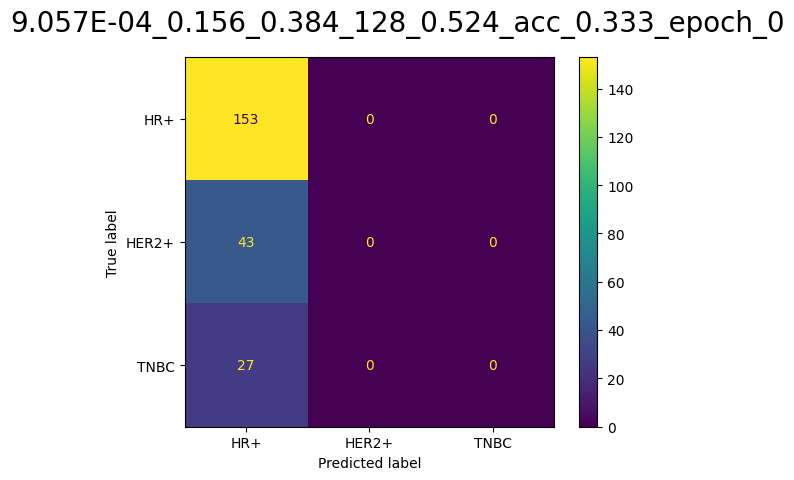

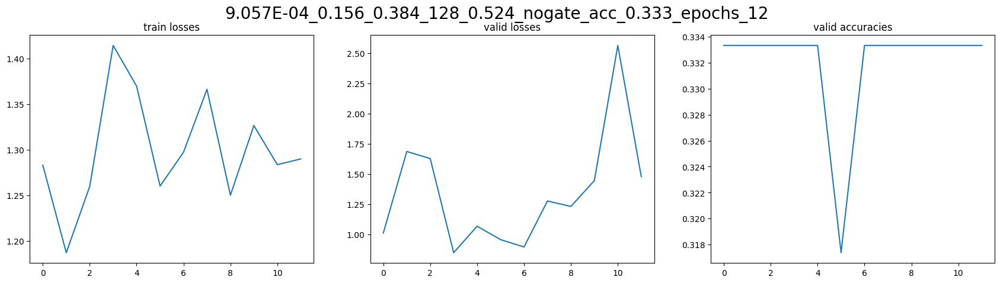

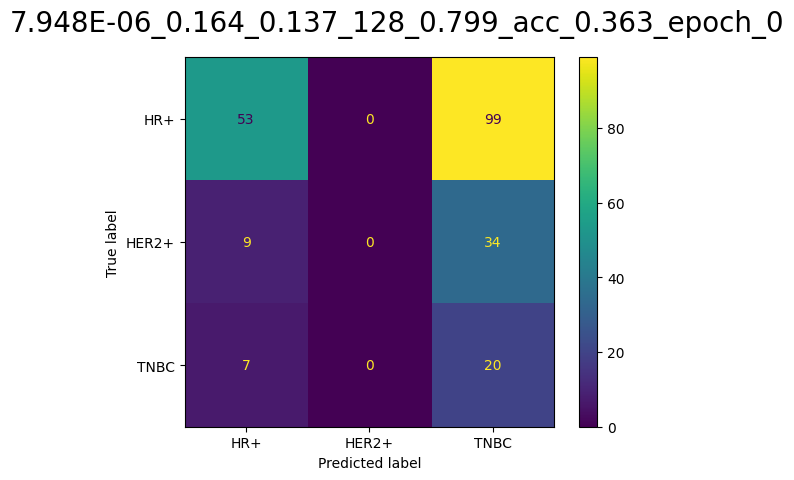

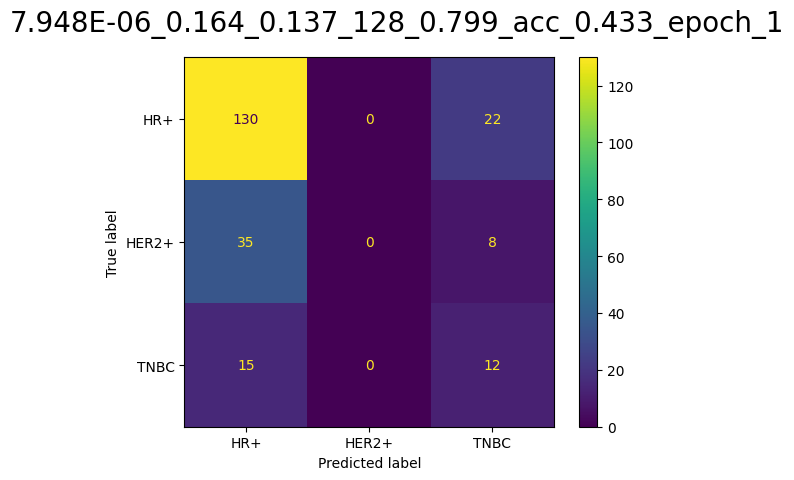

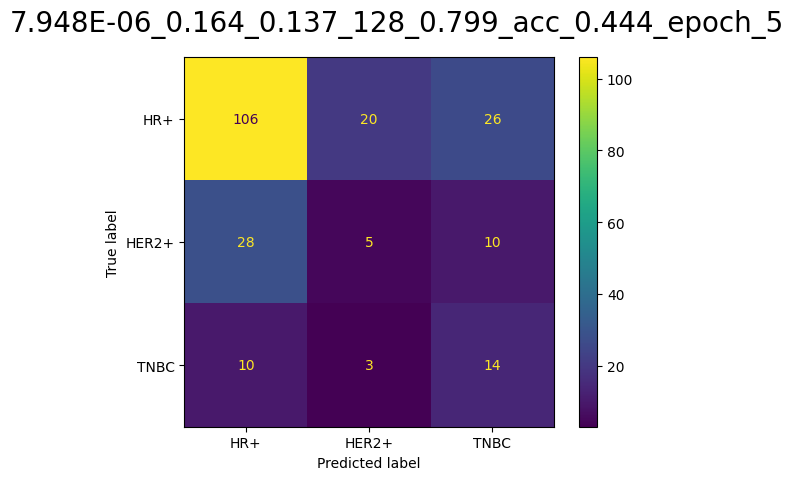

...

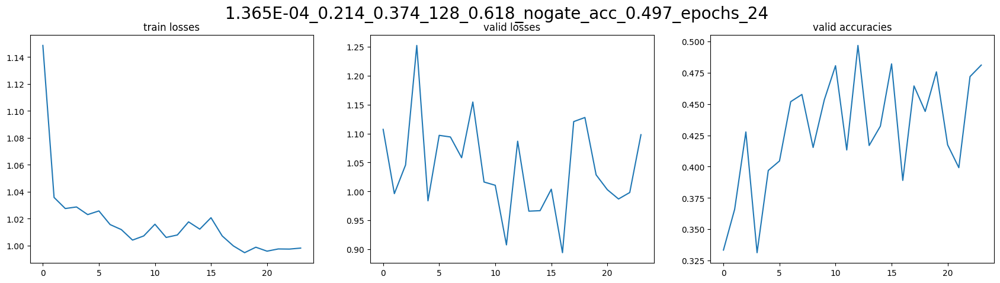

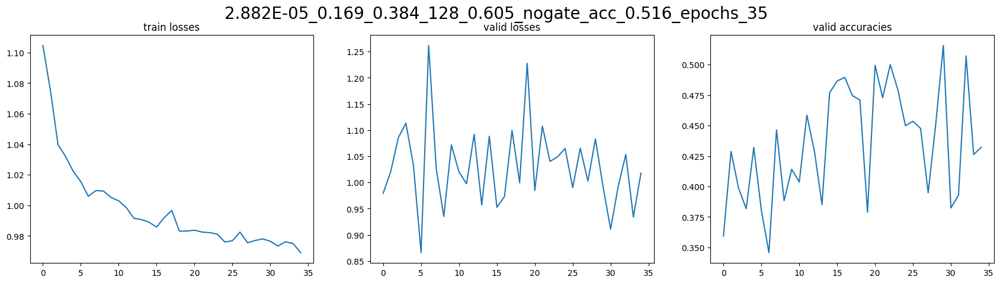

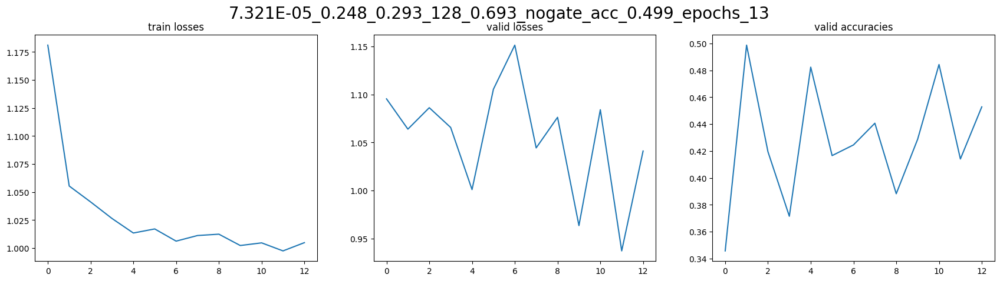

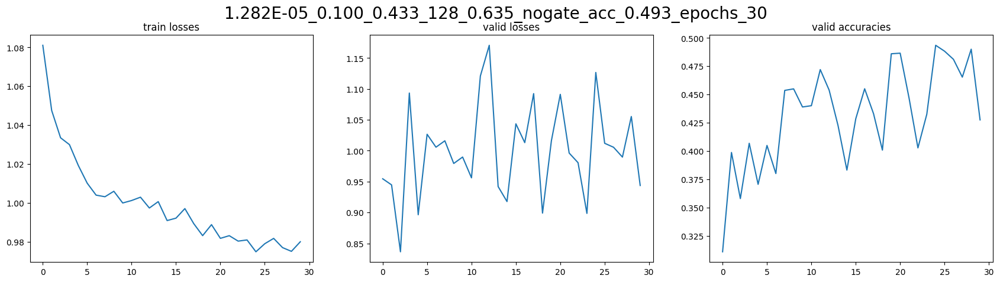

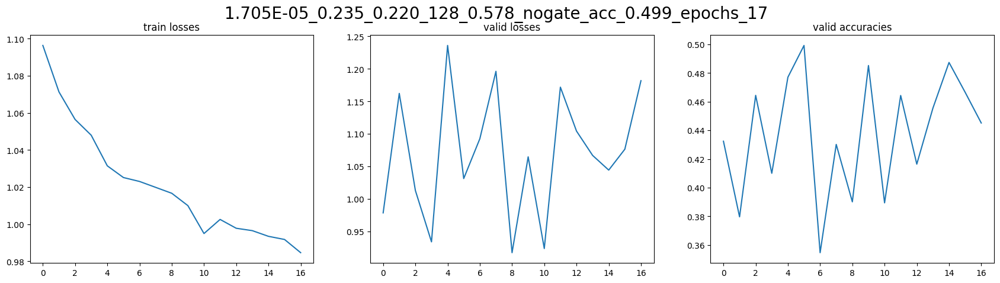

In [104]:
from topk.svm import SmoothTop1SVM
max_study_accuracy = 0
labels = ['HR+', 'HER2+', 'TNBC']
def train_model(trial: Trial=None, params: dict = None):
    if trial:
        max_epochs = 30
        early_stop_thresh = 10
        bag_weight = trial.suggest_float("bag_weight", 0.5, 0.9)
        lr = trial.suggest_float("lr", 1e-6, 1e-2, log=True)
        weight_decay = trial.suggest_float("weight_decay", 1e-9, 0.1, log=True)
        d_size = trial.suggest_categorical("d_size", [128, 256, 384])
        gated = trial.suggest_categorical("gated", [True, False])
        att_dropout = trial.suggest_float("att_dropout", 0.1, 0.5)
        fc_dropout = trial.suggest_float("fc_dropout", 0.1, 0.5)
        top_k = trial.suggest_int("top_k", 2, 8)
    if params:
        max_epochs = params['max_epochs']
        early_stop_thresh = params['max_epochs']
        bag_weight = params['bag_weight']
        lr = params['lr']
    global max_study_accuracy 
    
    device = 'cuda:0'

    # train_dataset = TCGABags(train_label_df.loc[~train_label_df.index.str.endswith(('v2', 'v3'))], labels)
    train_dataset = TCGABags(train_label_df, labels)
    test_dataset = TCGABags(test_label_df, labels, is_train=False)
    # train_dataset = TCGABags(train_label_df[train_label_df['label'] != 'HER2+'], labels)
    # test_dataset = TCGABags(test_label_df[test_label_df['label'] != 'HER2+'], labels, is_train=False)
    train_dl = DataLoader(train_dataset, batch_size=1, shuffle=True)
    test_dl = DataLoader(test_dataset, batch_size=1)
    weight = torch.Tensor((test_label_df.shape[0] / (test_label_df['label'].value_counts() * len(labels))).to_numpy()).to(device)
    global_loss_fn = nn.CrossEntropyLoss(weight=weight) #torch.Tensor([0.4, 0.4, 0.2]).to(device)
    instance_loss_fn = nn.CrossEntropyLoss()
    # global_loss_fn = SmoothTop1SVM(n_classes=3).cuda()
    # instance_loss_fn = SmoothTop1SVM(n_classes=2).cuda()
    model = CLAM_SB(gate=gated, k_sample=top_k, n_classes=3, instance_loss_fn=instance_loss_fn, embed_dim=1000, fc_dropout=fc_dropout, att_dropout=att_dropout, d_size=d_size)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    
    max_acc = 0
    model = model.to(device)
    train_losses = []
    valid_losses = []
    valid_accs = []
    best_epoch = 0
    failed_batches = []
    
    epoch = 0
    while epoch < max_epochs:
        train_loss = 0.
        val_loss = 0.
        train_inst_loss = 0.
        val_inst_loss = 0
        model.train()
        for i, (data, label) in enumerate(train_dl):
            data, label = data.to(device), label.to(device)
            try:
                logits, Y_prob, Y_hat, _, instance_dict = model(data[0], label=label, instance_eval=True)
            except:
                continue
            # print(len(data[0]))
            loss = global_loss_fn(logits, label)
            loss_value = loss.item()

            instance_loss = instance_dict['instance_loss']
            instance_loss_value = instance_loss.item()
            train_inst_loss += instance_loss_value
            
            total_loss = bag_weight * loss + (1-bag_weight) * instance_loss 

            train_loss += loss_value
            
            total_loss.backward()
            # step
            optimizer.step()
            optimizer.zero_grad()
        train_losses.append(train_loss/len(train_dl))
        actual_labels = []
        predicted_labels = []
        model.eval()
        with torch.inference_mode():
            for batch_idx, (data, label) in enumerate(test_dl):
                data, label = data.to(device), label.to(device)
                try:
                    logits, Y_prob, Y_hat, _, instance_dict = model(data[0], label=label, instance_eval=True)
                except:
                    # print(batch_idx)
                    failed_batches.append(batch_idx)
                    continue
                failed_batches
                actual_labels.append(label.cpu()[0])
                predicted_labels.append(Y_hat.cpu()[0][0])
                loss = global_loss_fn(logits, label)

                val_loss += loss.item()

                instance_loss = instance_dict['instance_loss']
                
                instance_loss_value = instance_loss.item()
                val_inst_loss += instance_loss_value
            
            accuracy = balanced_accuracy_score(np.array(actual_labels), np.array(predicted_labels))
            valid_losses.append(val_loss/len(test_dl))
            valid_accs.append(accuracy)
        
        if accuracy > max_acc:
            print('Epoch: {} \tAvgerage Training Loss: {:.6f} \tAverage Validation Loss: {:.6f}\tValidation accuracy: {:.6f}'.format(
                epoch, 
                (train_loss/len(train_dl)),
                (val_loss/len(test_dl)),
                accuracy
                ))
            best_epoch = epoch
            max_acc = accuracy
            # save checkpoint
            max_epochs = max_epochs if max_epochs - epoch > 5 else max_epochs + 5
            # save checkpoint as best model
        elif epoch - best_epoch > early_stop_thresh:
            print(f"Early stopped training at epoch {epoch}")
            break
        if accuracy > max_study_accuracy:
            corr_title = '{:.3E}_{:.3f}_{:.3f}_{:d}_{:.3f}_acc_{:.3f}_epoch_{:d}'.format(lr, att_dropout, fc_dropout, d_size, bag_weight, max(valid_accs), epoch)
            plot_confusion_matrix(actual_labels, predicted_labels, corr_title, labels)
            checkpoint = {
                'epoch': epoch + 1,
                'valid_loss_min': val_loss/len(test_dl),
                'valid_accuracy': accuracy,
                'state_dict': model.state_dict(),
                'optimizer': optimizer.state_dict()
            }
            save_ckp(checkpoint, corr_title)

            max_study_accuracy = accuracy
        epoch += 1
    
    gate_str = 'gate' if gated else 'nogate'
    title = '{:.3E}_{:.3f}_{:.3f}_{:d}_{:.3f}_{:s}_acc_{:.3f}_epochs_{:d}'.format(lr, att_dropout, fc_dropout, d_size, bag_weight, gate_str, max(valid_accs), len(valid_losses))
    print(failed_batches)
    plot_training_stats(train_losses, valid_losses, valid_accs, title)

    del model
    torch.cuda.empty_cache()
    gc.collect()
    return max(valid_accs)
study = optuna.create_study(direction="maximize")
study.optimize(lambda trial: train_model(trial), n_trials=100, gc_after_trial=True)

In [ ]:
re_test_df = pd.read_csv('../data/re_test.csv', index_col=0)
re_test_dataset = TCGABags(re_test_df, labels)
re_test_dl = DataLoader(re_test_dataset, batch_size=1)

In [176]:
# no_aug_ckpt = torch.load('../checkpoints/4.244E-04_0.364_0.283_256_0.642_acc_0.567_epoch_26.pt')
no_aug_ckpt = torch.load('./4.412E-05_0.202_0.381_128_0.646_acc_0.553_epoch_16')
instance_loss_fn = nn.CrossEntropyLoss()
clam_model = CLAM_SB(att_dropout=0.202, fc_dropout=0.109, d_size=128, embed_dim=1000, is_mb=True, k_sample=4, n_classes=3, instance_loss_fn=instance_loss_fn)
clam_model.load_state_dict(no_aug_ckpt['state_dict'], strict=False)
clam_model.eval()
predicted_labels = []
actual_labels = []
with torch.inference_mode():
    for (data, label) in re_test_dl:
        logits, Y_prob, Y_hat, _, instance_dict = clam_model(data[0], label=label, instance_eval=True)
        predicted_labels.append(Y_hat.cpu()[0][0])
        actual_labels.append(label)

accuracy_score(actual_labels, predicted_labels)

0.36666666666666664

In [137]:
get_model_stats(actual_labels, predicted_labels)

d:\jswietek\mgr\env\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
d:\jswietek\mgr\env\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


('accuracy_0.39999999999999997 precision_0.2916666666666667 recall_0.4 f1_0.30147058823529416',
 'precision_[0.5   0.    0.375] recall_[0.3 0.  0.9] f1_[0.375      0.         0.52941176]')

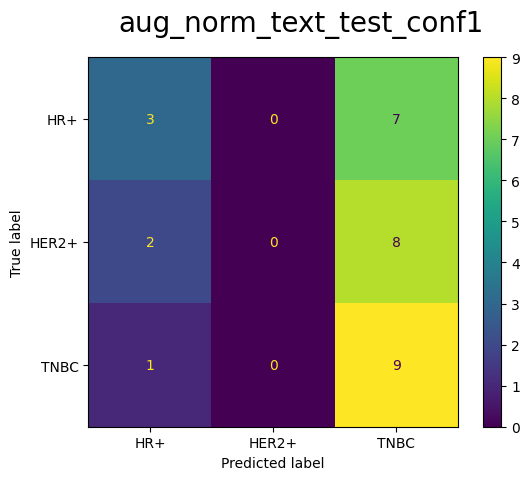

In [138]:
plot_confusion_matrix(actual_labels, predicted_labels, 'aug_norm_text_test_conf1', labels)